### Project Setup and File Conversions

In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import random
from fpdf import FPDF
import plotly as pl
import plotly.graph_objects as go
import plotly.io as pio
import folium
from folium.plugins import HeatMap
from sklearn.linear_model import LinearRegression
import swifter

# Analysis of Inflow and Outflow of Immigrants Across EU

### Data Source Preprocessing

#### Defining Countries of Interest
We will only include countries that are part of both EU and Schengen. 

In [2]:

schengen_countries = [
    'Austria', 'Belgium', 'Croatia', 'Czechia', 'Denmark', 'Estonia',
    'Finland', 'France', 'Germany', 'Greece', 'Hungary', 'Italy', 'Latvia', 'Lithuania', 'Luxembourg',
    'Malta', 'Netherlands', 'Poland', 'Portugal', 'Slovakia', 'Slovenia', 'Spain','Sweden']


#### Define Function to clean data
To clean and be able to process the data easier, we defined a function that will perform the following actions:
- Remove the irrelevant columns and header rows.
- Set the column names to the years and row index to the countries.
- Replace the string representing missing values to a type that is more easily handled by pandas.
- Filter to only the countries of interest.

In [3]:

def clean_data(data):
    # Removes unnecessary rows and columns
    data.drop(data.columns[1], axis=1, inplace=True)
    data.drop(data.index[[-1, 1]], inplace=True)

    # Extracts years from year row
    years = data.iloc[0].dropna().values[1:].astype(int)
    data.drop(data.index[0], inplace=True)

    # Removes columns without data
    data.dropna(axis=1, how='all', inplace=True)

    # Assign years as names to columns
    data.rename(columns=dict(zip(data.columns[1:], years)), inplace=True)
    data.rename(columns={data.columns[0]: 'Country'}, inplace=True)

    # Set the index to countries
    data.set_index('Country', inplace=True)

    # Change missing values to NaN 
    data.replace('..', np.nan, inplace=True)

    # Filtering data on only schengen countries
    data.rename(index={'Slovak Republic': 'Slovakia'}, inplace=True)
    data.query('index in @schengen_countries', inplace=True)

    return data

#### Define Function to aggregate data
The function below creates columns for total and average on the dataframe.

In [4]:
def aggregate_data(data):
    data['Total'] = data.sum(axis=1)
    data['Average'] = data.mean(axis=1)
    return data

### Apply Clean and Aggregate functions to each dataset

#### Inflow of foreign population
**Inflow Population** in the dataset refers to the number of people moving to a country at a certain year.

In [5]:
file = 'Inflows of foreign population by nationality.xls'
foreign_population_inflow_df = pd.read_excel(f'data/converted/{file}', skiprows = 4)
clean_data(foreign_population_inflow_df)
aggregate_data(foreign_population_inflow_df)
foreign_population_inflow_df.head(5)

,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,...,2015,2016,2017,2018,2019,2020,2021,2022,Total,Average
Country,,,,,,,,,,,,,,,,,,,,,
Austria,65954.0,74786.0,86144.0,93341.0,104246.0,97995.0,82899.0,91546.0,94368.0,91660.0,...,198658.0,158746.0,139329.0,131724.0,134966.0,121311.0,139543.0,NaN,2529126.0,219924.000000
Belgium,57295.0,65974.0,70230.0,68800.0,72446.0,77411.0,83433.0,93387.0,106012.0,102714.0,...,128762.0,106087.0,109167.0,119663.0,129450.0,101553.0,122386.0,NaN,2193010.0,190696.521739
Czechia,4227.0,11323.0,43648.0,57438.0,50804.0,58576.0,66125.0,102511.0,76151.0,38199.0,...,31589.0,34808.0,43527.0,55872.0,63340.0,53795.0,67270.0,NaN,1002862.0,87205.391304
Denmark,22766.0,24642.0,21485.0,18385.0,18706.0,20146.0,23979.0,31430.0,37018.0,31957.0,...,58695.0,54641.0,49041.0,45259.0,42268.0,37810.0,47274.0,NaN,779387.0,67772.782609
Estonia,NaN,NaN,NaN,NaN,759.0,981.0,1488.0,1952.0,1929.0,2229.0,...,7370.0,7693.0,9067.0,9711.0,10953.0,10309.0,12468.0,NaN,83870.0,8828.421053


#### Outflow of Foreign Population
**Outflow Population** in the dataset refers to the number of people moving out of a country at a certain year.

In [6]:
file = 'Outflows of foreign population by nationality.xls'
foreign_population_outflow_df = pd.read_excel(f'data/converted/{file}', skiprows=4)

clean_data(foreign_population_outflow_df)
aggregate_data(foreign_population_outflow_df)
foreign_population_outflow_df.head(5)

,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,...,2015,2016,2017,2018,2019,2020,2021,2022,Total,Average
Country,,,,,,,,,,,,,,,,,,,,,
Austria,44350.0,51004.0,44478.0,48940.0,50018.0,49800.0,55045.0,56643.0,60226.0,67219.0,...,80141.0,89026.0,89556.0,91707.0,90010.0,79410.0,84574.0,NaN,1498776.0,130328.347826
Belgium,35568.0,31391.0,31046.0,33921.0,37728.0,38459.0,39354.0,38511.0,44937.0,49126.0,...,59845.0,61780.0,58582.0,56790.0,46533.0,52027.0,59051.0,NaN,1065764.0,92675.130435
Czechia,161.0,20566.0,31091.0,33203.0,33784.0,21796.0,31388.0,18424.0,3821.0,9350.0,...,15024.0,13441.0,14428.0,16248.0,17476.0,26766.0,18220.0,NaN,400016.0,34784.000000
Denmark,13988.0,14798.0,14887.0,15757.0,15761.0,16295.0,17269.0,18995.0,23341.0,26596.0,...,30605.0,37378.0,41531.0,45435.0,52364.0,41743.0,31493.0,NaN,601157.0,52274.521739
Estonia,NaN,NaN,NaN,NaN,648.0,646.0,563.0,444.0,546.0,686.0,...,3290.0,3402.0,4344.0,3907.0,6221.0,5507.0,5531.0,NaN,37970.0,3996.842105


#### Stock of Foreign Population
**Foreign Population** refers to individuals living on a certain country who are not citizens or nationals of the country. This could refer to people who are born outside the country but are living under immigrant or refugee status.

In [7]:
file = 'Stock of foreign population by nationality.xls'
stock_population_foreign_df = pd.read_excel(f'data/converted/{file}', skiprows=4)

clean_data(stock_population_foreign_df)
aggregate_data(stock_population_foreign_df)
stock_population_foreign_df.head(5)

,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,...,2015,2016,2017,2018,2019,2020,2021,2022,Total,Average
Country,,,,,,,,,,,,,,,,,,,,,
Austria,693955.0,701768.0,730261.0,746753.0,754216.0,774401.0,796666.0,804779.0,829679.0,860004.0,...,1146078.0,1267674.0,1341930.0,1395880.0,1438923.0,1486223.0,1531072.0,1586709.0,23705564.0,1.975464e+06
Belgium,897110.0,861685.0,846734.0,850077.0,860287.0,870862.0,900473.0,932161.0,971448.0,1013260.0,...,1276903.0,1333243.0,1353775.0,1376432.0,1413750.0,1478847.0,1489156.0,1514863.0,26146347.0,2.178862e+06
Czechia,228862.0,200951.0,210794.0,231608.0,240421.0,254294.0,278312.0,321456.0,392315.0,437565.0,...,449367.0,464670.0,493441.0,524142.0,564345.0,593366.0,632570.0,658564.0,9343088.0,7.785907e+05
Denmark,259357.0,258629.0,266729.0,265424.0,271211.0,267604.0,270051.0,278096.0,298490.0,320188.0,...,422559.0,463147.0,484986.0,505992.0,525898.0,537122.0,539494.0,562248.0,8604074.0,7.170062e+05
Estonia,291724.0,287072.0,273766.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,211431.0,211517.0,212213.0,213667.0,216350.0,215611.0,201252.0,203383.0,3171737.0,4.228983e+05


#### Stock of Foreign-born Population

In [8]:
file = 'Stock of foreign-born population by country of birth.xls'
stock_population_foreign_born_df = pd.read_excel(f'data/converted/{file}', skiprows=4)

clean_data(stock_population_foreign_born_df)
aggregate_data(stock_population_foreign_born_df)
stock_population_foreign_born_df.head(5)

,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,...,2015,2016,2017,2018,2019,2020,2021,2022,Total,Average
Country,,,,,,,,,,,,,,,,,,,,,
Austria,872000.0,843000.0,1112094.0,1137351.0,1141212.0,1154776.0,1195156.0,1215695.0,1235678.0,1260277.0,...,1484595.0,1594723.0,1656266.0,1697123.0,1728554.0,1765311.0,1797573.0,1842426.0,31406481.0,2.617207e+06
Belgium,1064214.0,1080790.0,1117261.0,1156732.0,1185456.0,1220062.0,1268915.0,1319302.0,1380323.0,1443937.0,...,1786080.0,1849287.0,1880808.0,1920457.0,1973007.0,2056415.0,2079757.0,2125700.0,36197218.0,3.016435e+06
Czechia,NaN,448477.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,416454.0,433290.0,465056.0,467580.0,507051.0,533639.0,570139.0,453424.0,6214639.0,8.878056e+05
Denmark,296924.0,308674.0,321794.0,331506.0,337802.0,343367.0,350436.0,360902.0,378665.0,401771.0,...,501057.0,540503.0,570581.0,591678.0,607622.0,614353.0,617770.0,640922.0,10333636.0,8.611363e+05
Estonia,257065.0,252686.0,249496.0,NaN,NaN,NaN,NaN,NaN,NaN,221888.0,...,194730.0,193859.0,192561.0,196289.0,198064.0,199042.0,198243.0,201253.0,3592565.0,3.991739e+05


### Data Cleaning

## Data Analysis and Visualization

### Part 1: Visualizing Migrant Populations for each EU country
In the first part of our data analysis and visualization. We create bar graphs to compare which countries have the highest migrant population for each category.

#### Define Function for creating bar charts
The function defined below accepts the population dataframe and its name. A bar chart will be created with x values corresponding to each countries and y values to total population count across all years. A color scale is introduced to better emphasize which country has the highest numbers.

In [9]:
def create_population_bar_chart(data, field_name ='Foreign Population'):
    sorted_df = data.sort_values(by='Total', ascending = False)
    #Creates a bar chart for population for each country
    bar_chart = go.Bar(
        x = sorted_df.index,
        y = sorted_df['Total'],
        name = f'{field_name}',
        marker = {'color': sorted_df['Total'], 'colorscale': 'Viridis'}
    )
    figure = go.Figure(data = [bar_chart])

    # Adds the necessary axis names
    figure.update_layout(
        title = f'{field_name} of Schengen Countries from 2000-2022',
        xaxis_title = 'Country',
        yaxis_title = field_name,
        height = 500
    )
    figure.show()

### Inflow Population

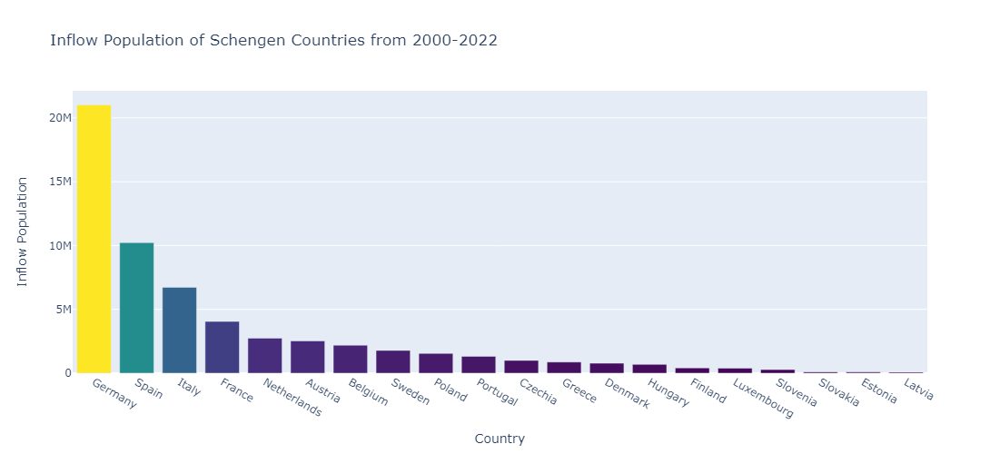

In [10]:
create_population_bar_chart(foreign_population_inflow_df, 'Inflow Population')

### Outflow Population

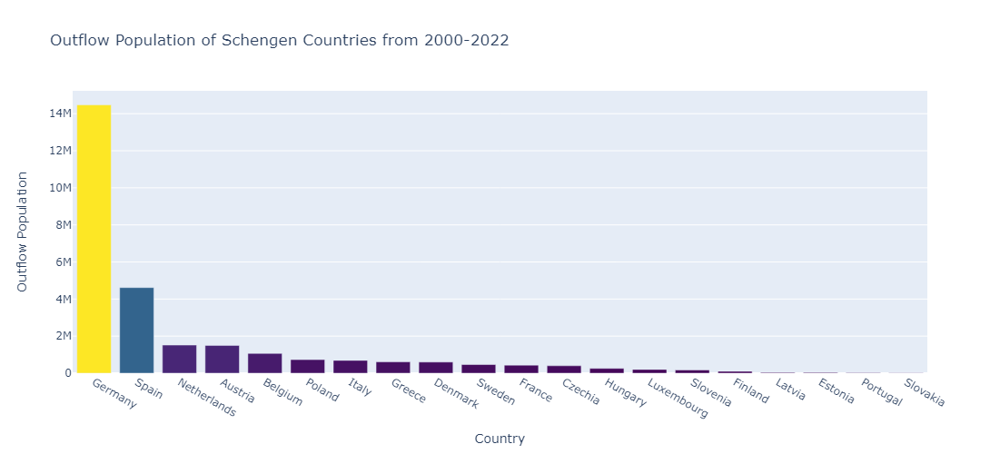

In [11]:
create_population_bar_chart(foreign_population_outflow_df, 'Outflow Population')

### Stock of Foreign Population

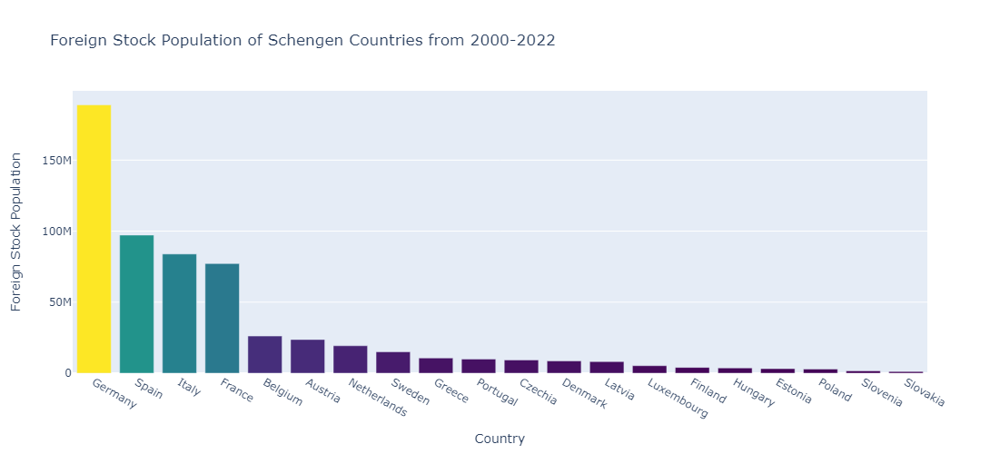

In [12]:
create_population_bar_chart(stock_population_foreign_df, 'Foreign Stock Population')

### Stock of Foreign Born Population

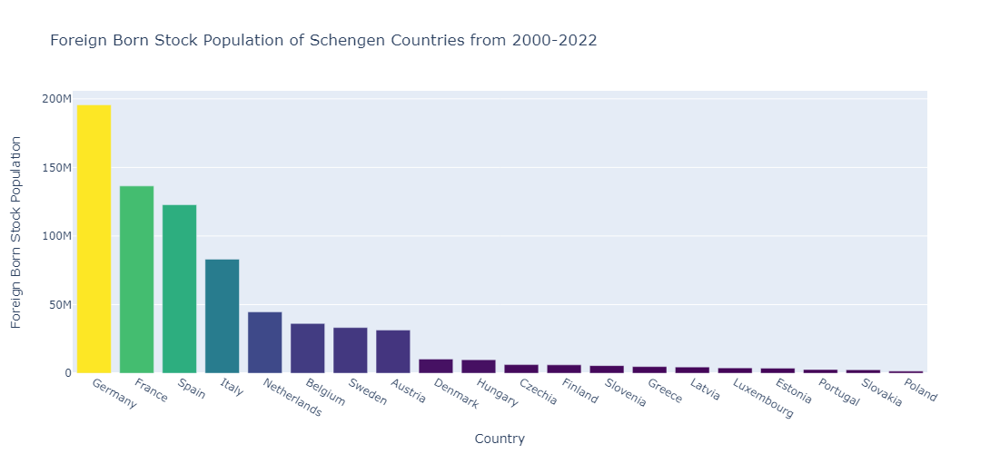

In [13]:
create_population_bar_chart(stock_population_foreign_born_df, 'Foreign Born Stock Population')

### Part 2: Time Series Analysis of Countries

#### Visualization of population change over time across each EU country

#### Total Inflow and Outflow 2000 - 2022

In [14]:
def create_time_series_plot(data):
    data.dropna(inplace = True)
    #Create a linear plot from dataframe
    plot = go.Scatter(
        x =data.index[:-2],
        y =data.values[:-2],
        mode='lines',  
    )

    #Adds necessary labels to plot
    layout = go.Layout(
        title=f'Time Series Analysis for {data.name}',  
        xaxis=dict(title='Year'), 
        yaxis=dict(title='Total Inflow Population'),  
        height = 300,
    )
    fig = go.Figure(data=[plot], layout=layout)
    fig.show()

### Inflow Population

##### Side Note:
The Swifter package was tested on this project to attempt parallelization. However, when applied to this function, it produced an error in the output where several copies of a random graph were shown in the first few entries. As seen below:

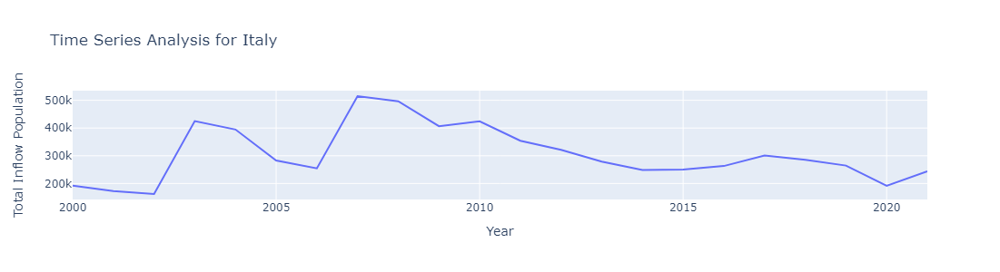

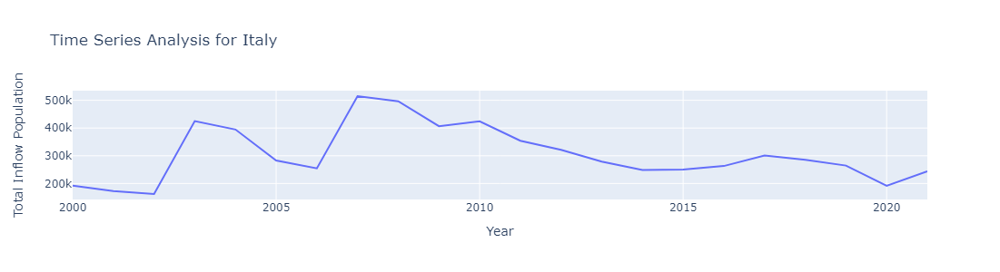

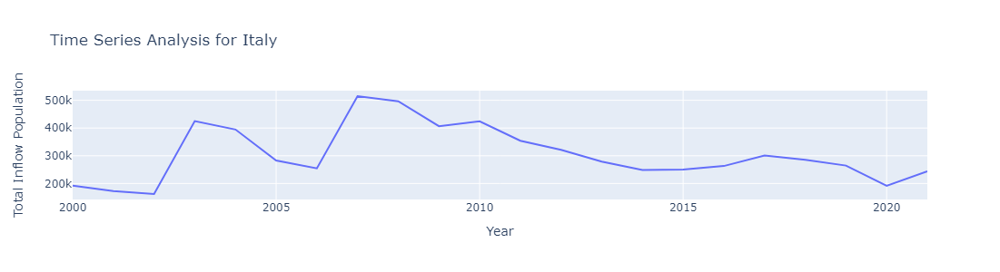

Pandas Apply:   0%|          | 0/20 [00:00<?, ?it/s]

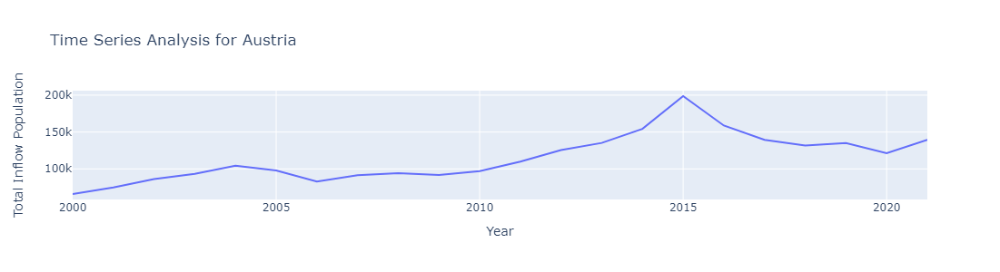

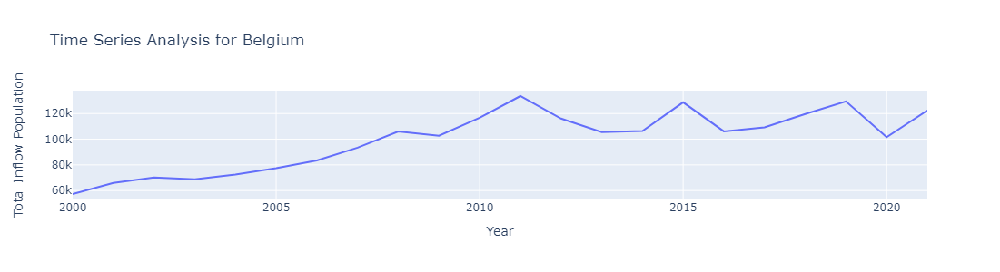

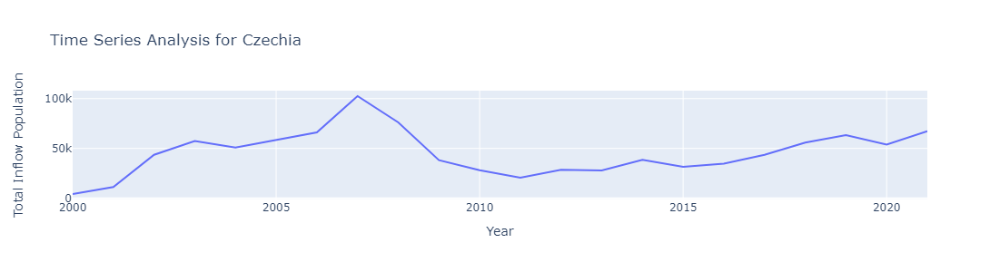

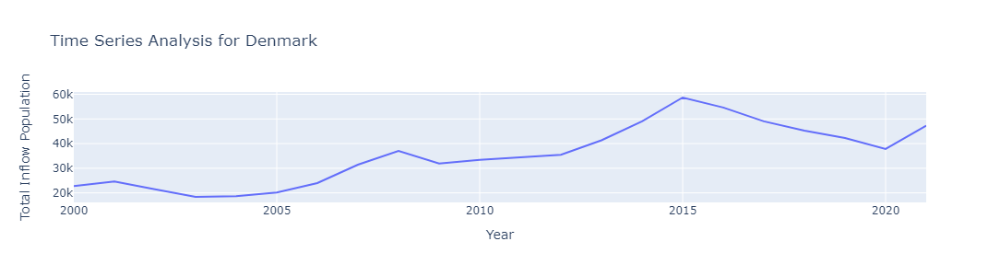

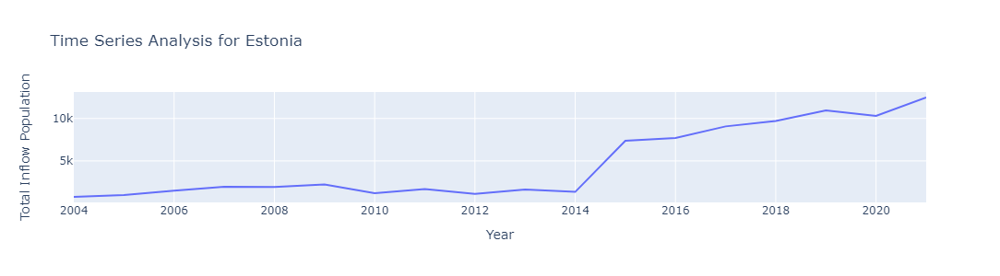

...

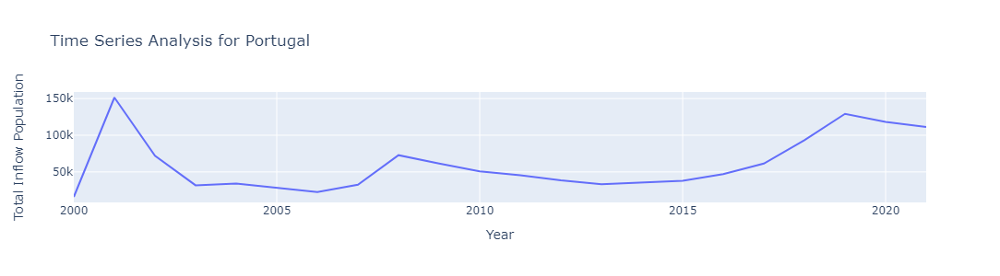

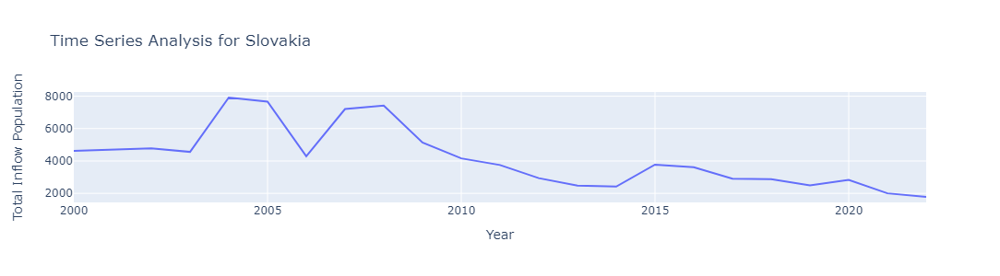

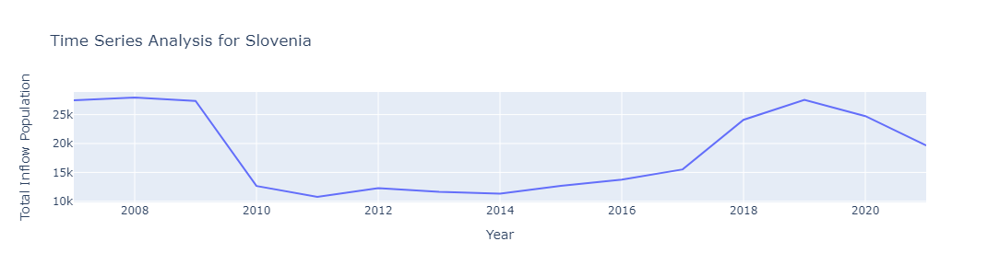

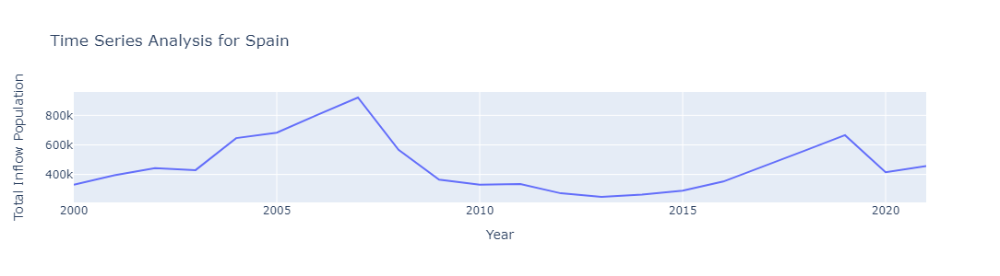

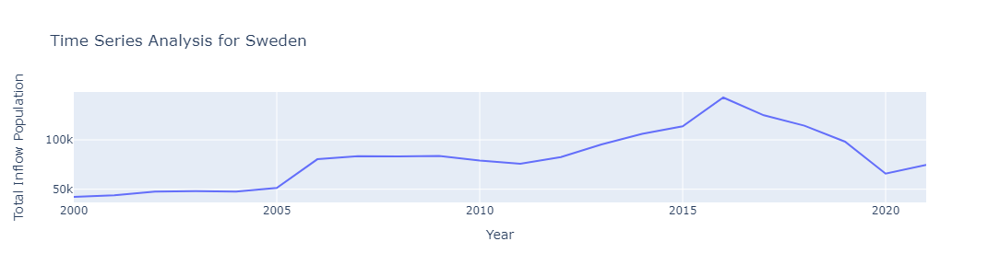

In [15]:
foreign_population_inflow_df.swifter.apply(create_time_series_plot, axis=1);

We went back to applying the function without parallelization.

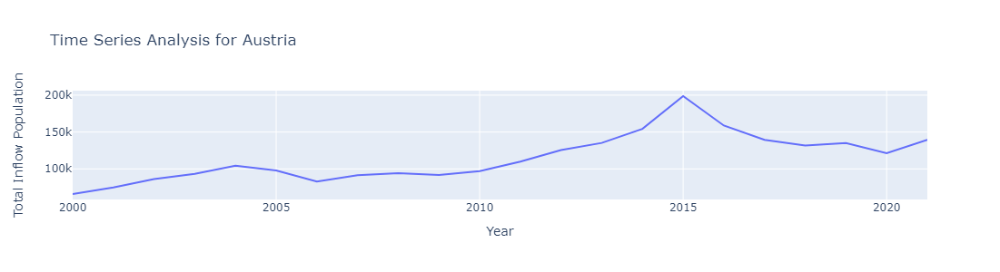

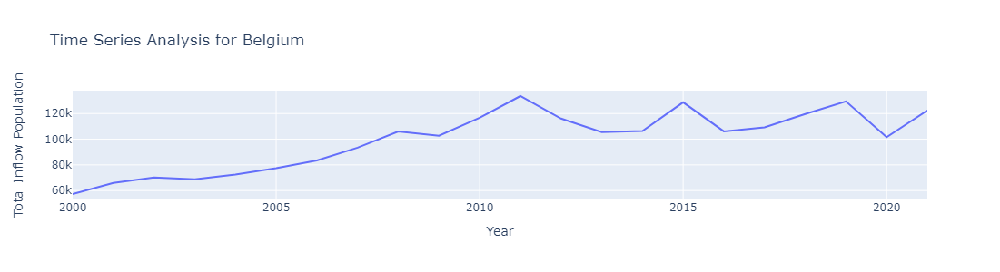

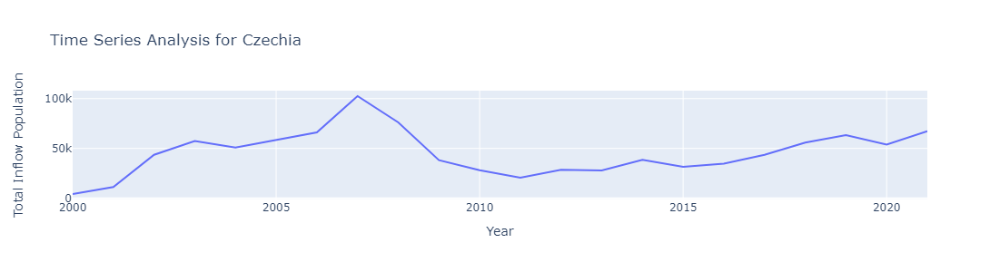

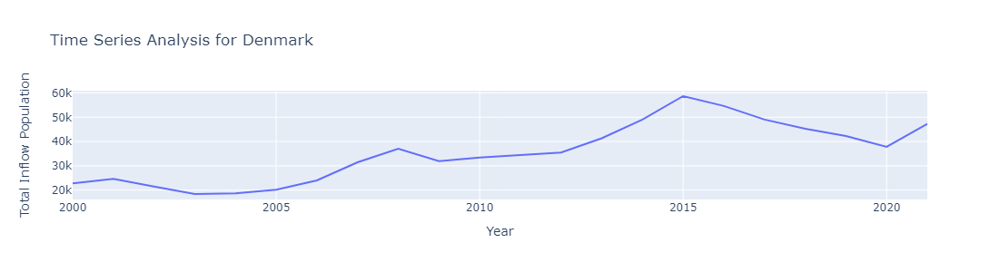

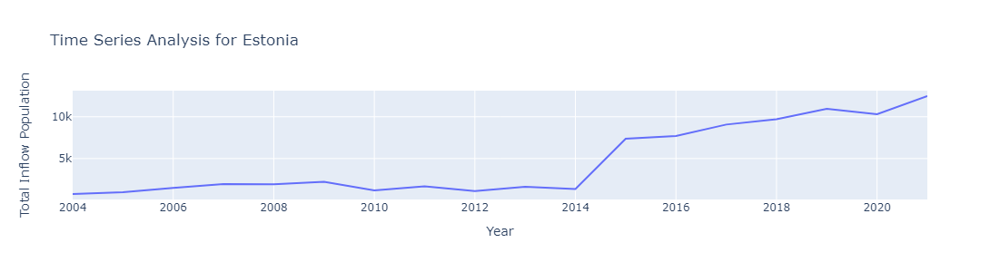

...

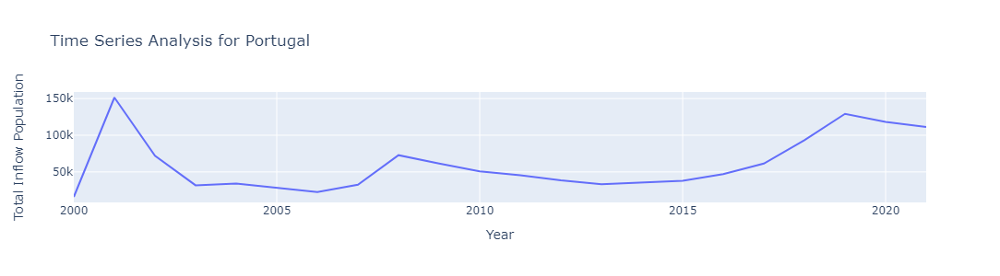

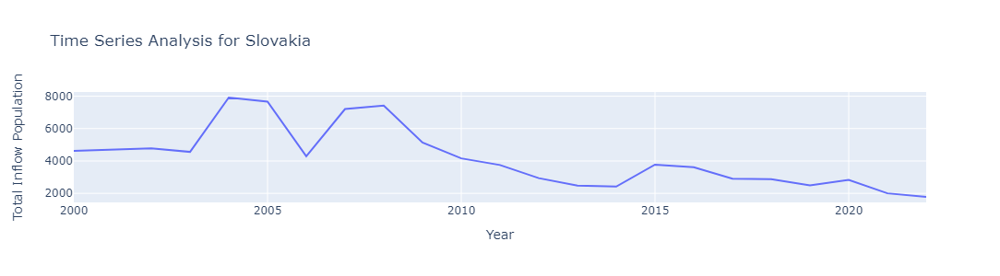

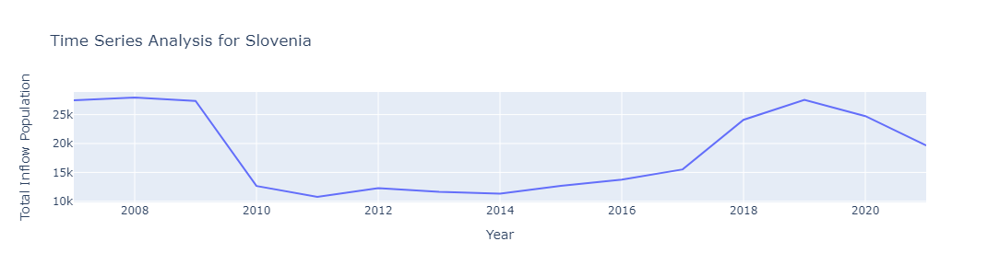

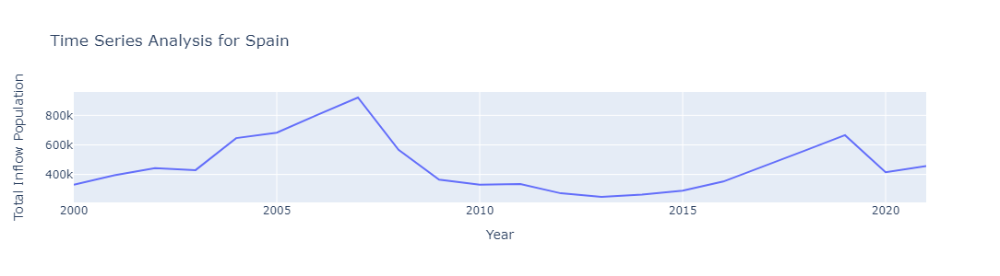

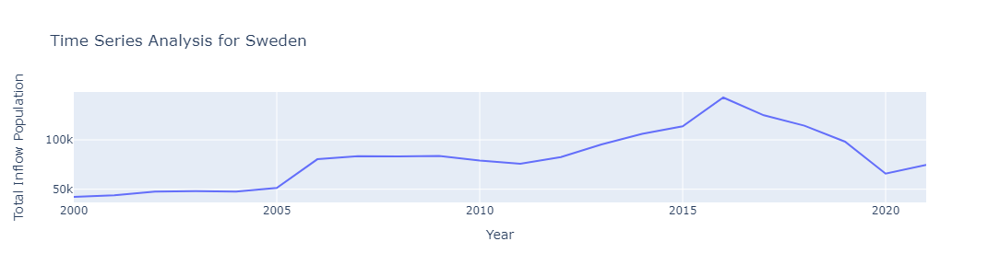

In [16]:
foreign_population_inflow_df.apply(create_time_series_plot, axis=1);

### Outflow Population

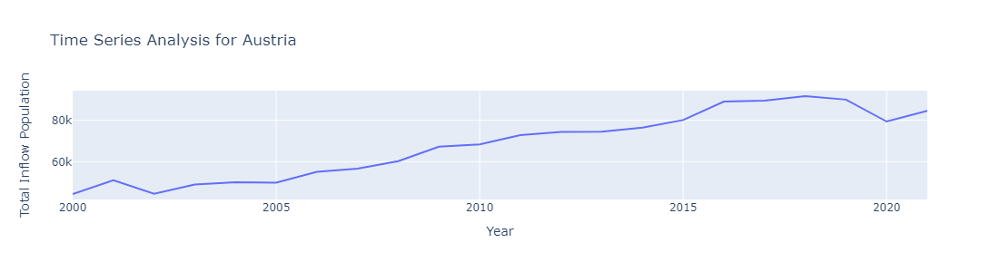

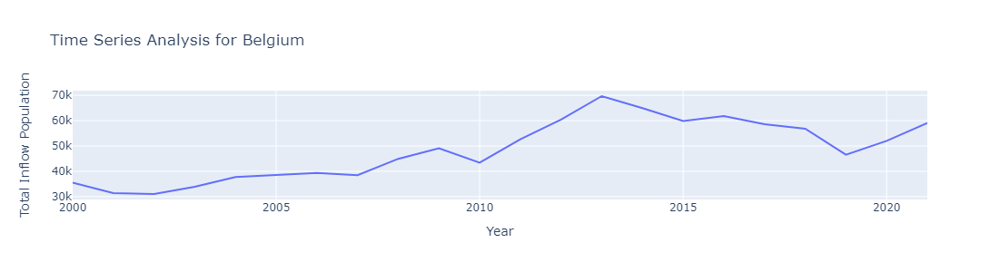

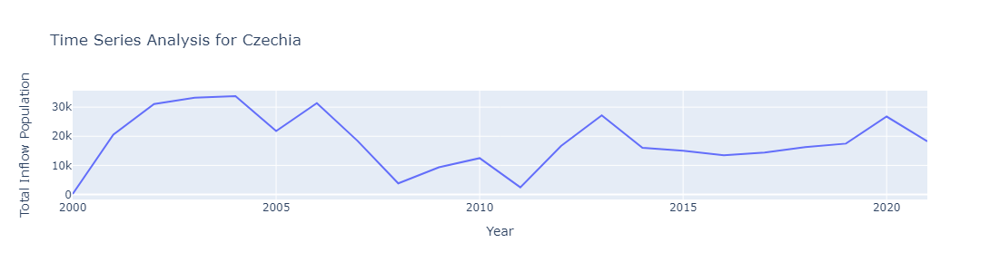

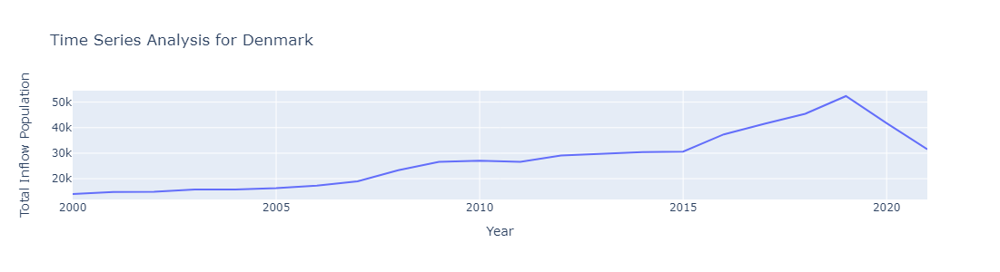

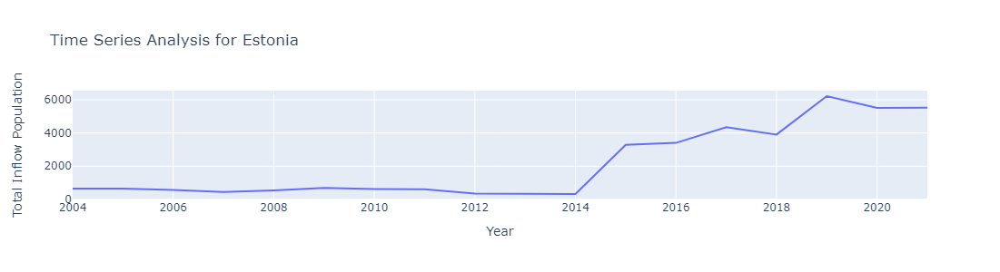

...

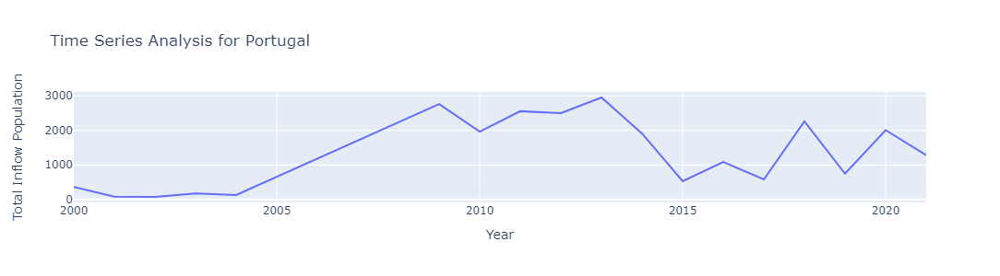

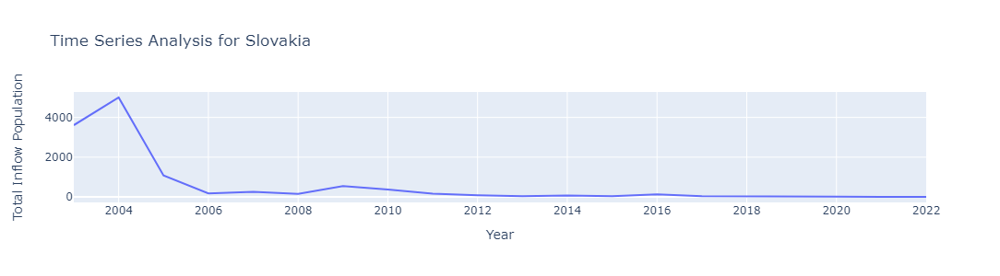

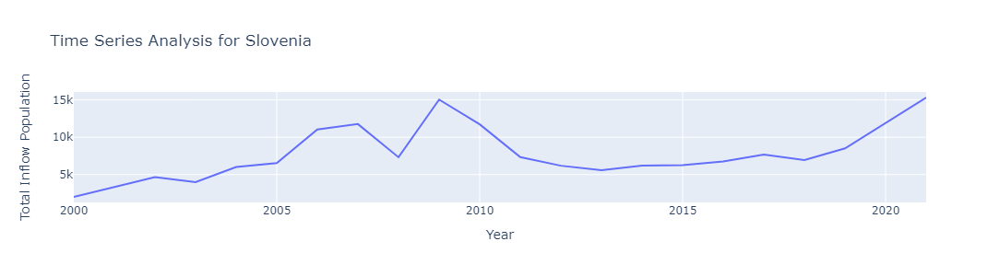

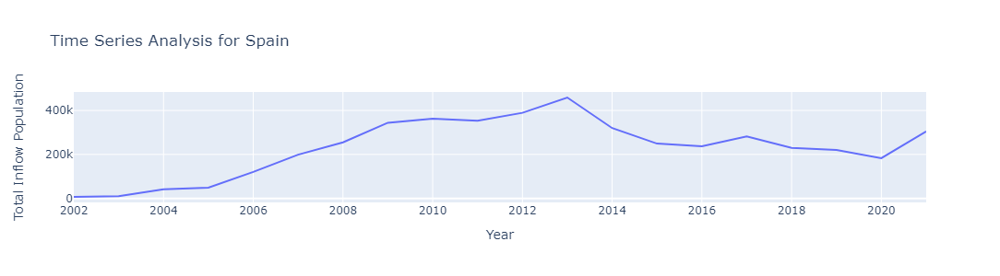

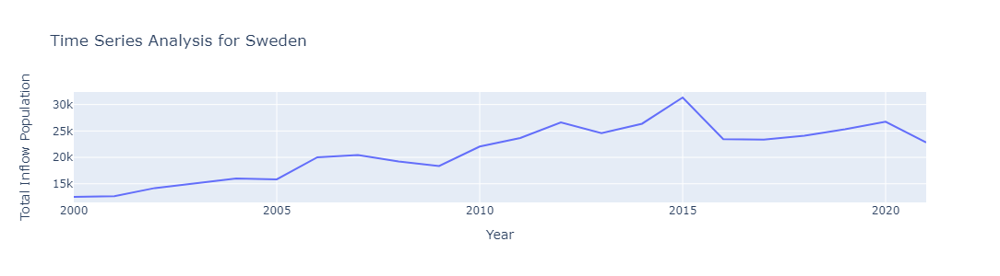

In [17]:
foreign_population_outflow_df.apply(create_time_series_plot, axis=1);

### Stock of Foreign Population

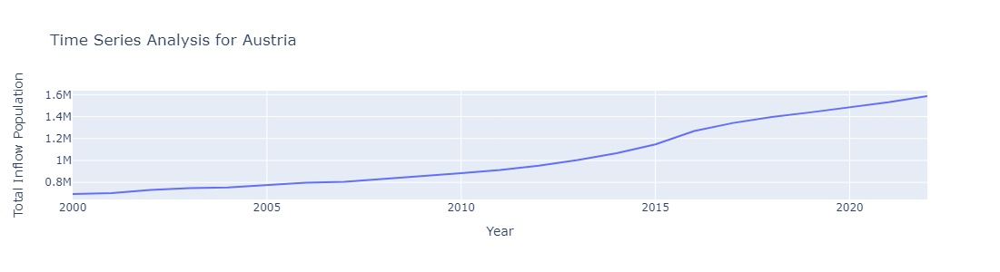

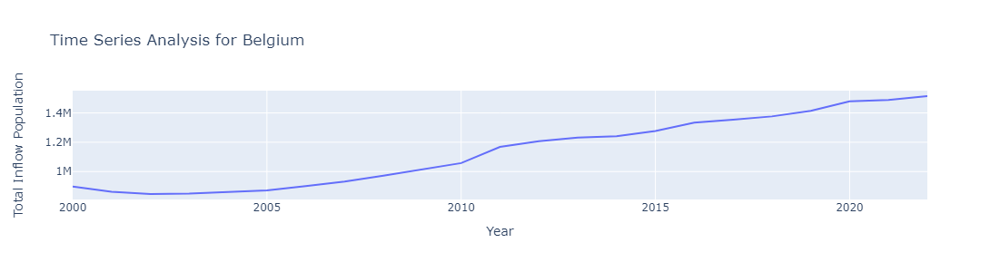

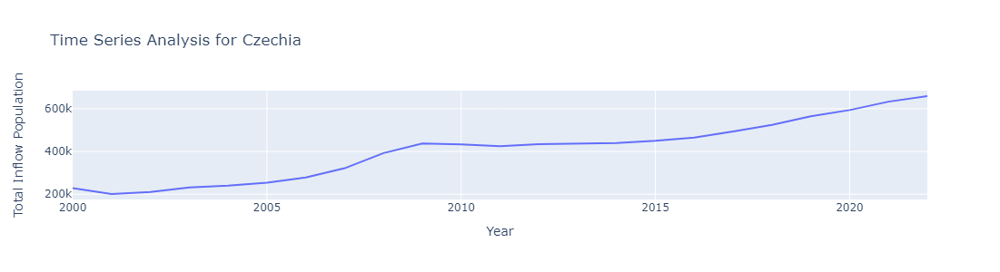

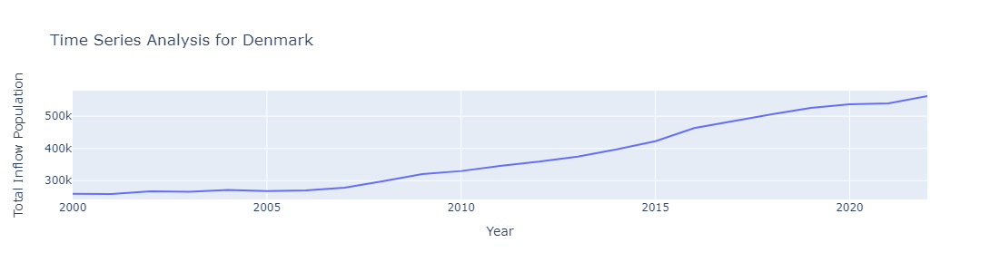

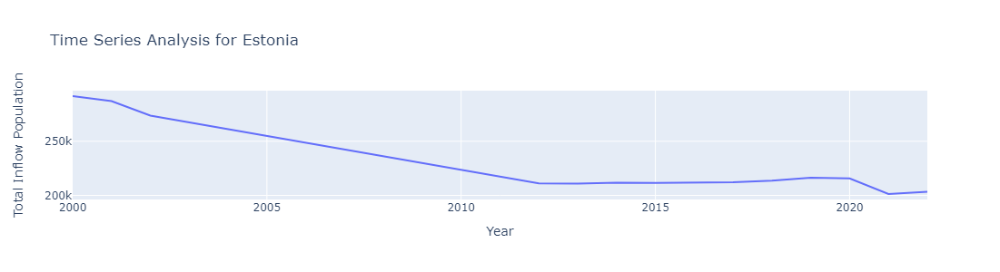

...

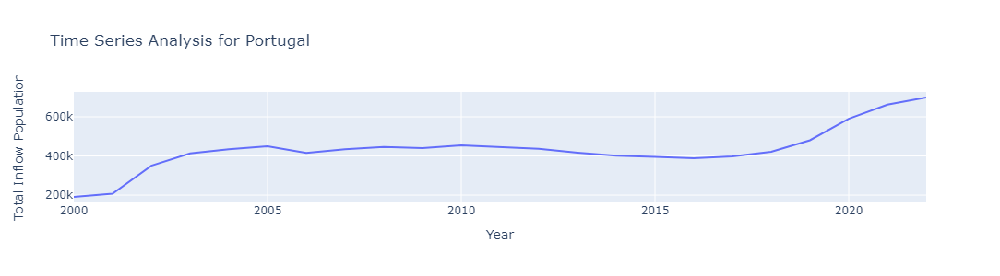

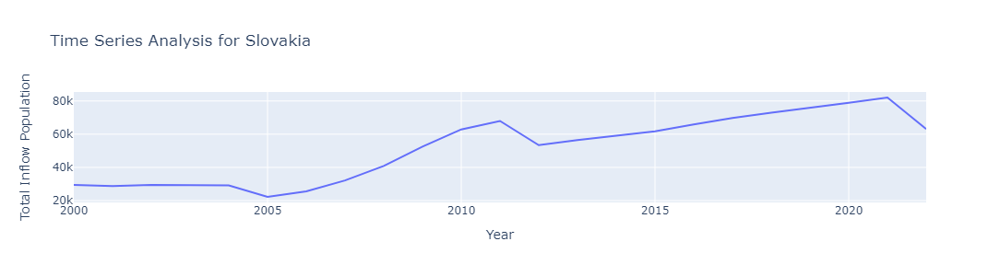

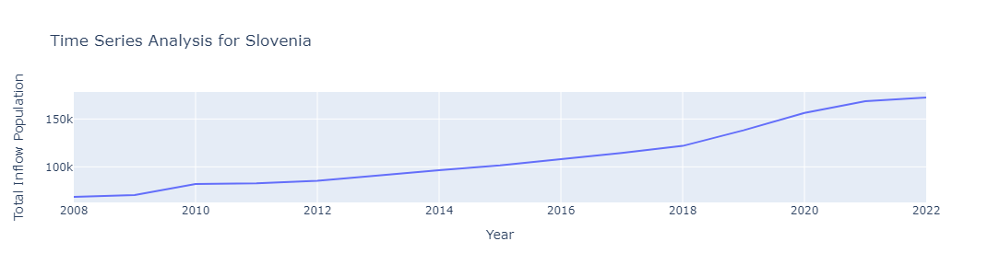

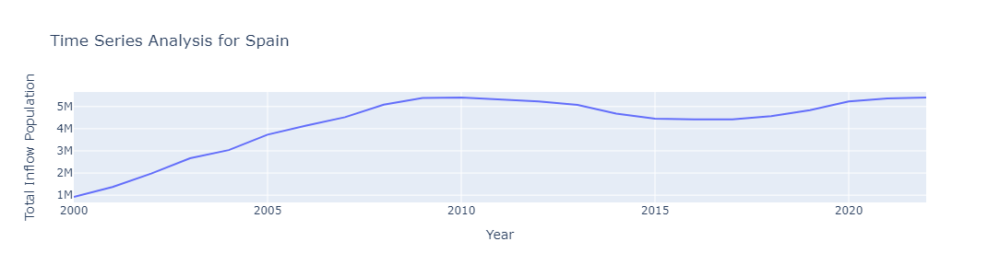

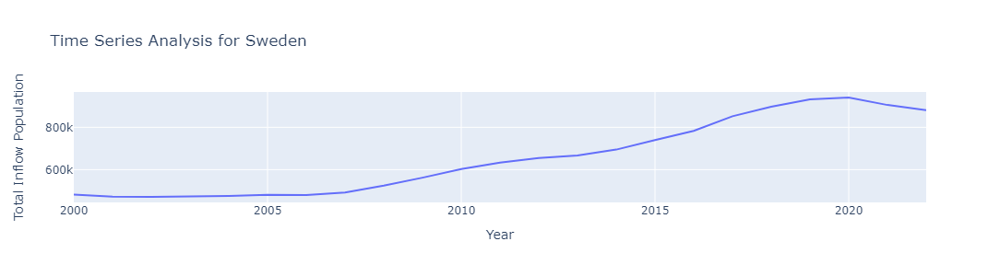

In [18]:
stock_population_foreign_df.apply(create_time_series_plot, axis=1);

### Stock of Foreign Born Population

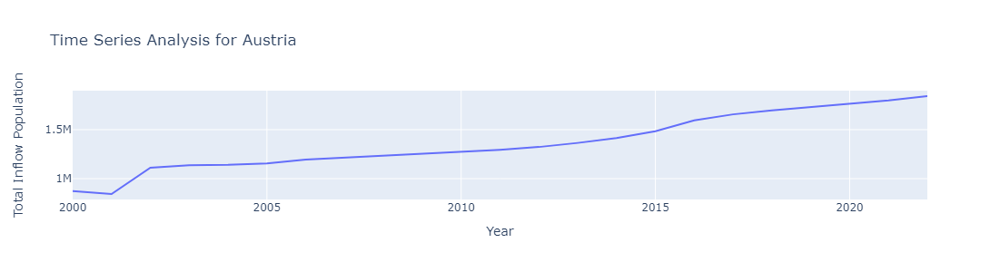

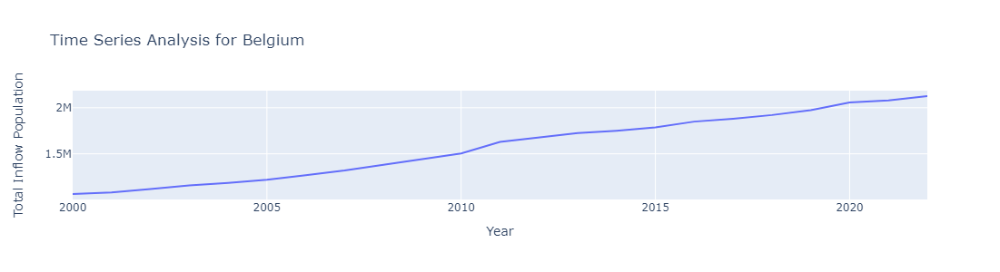

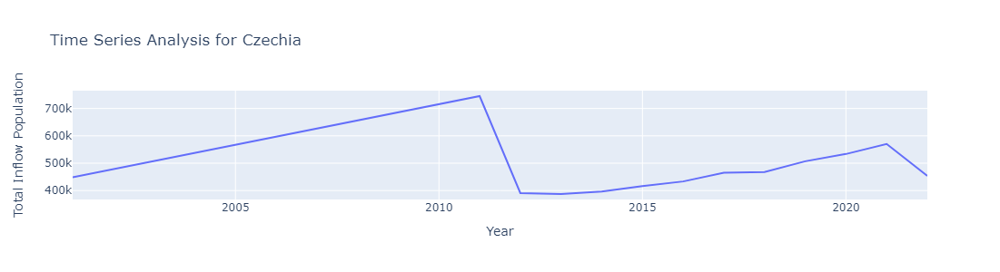

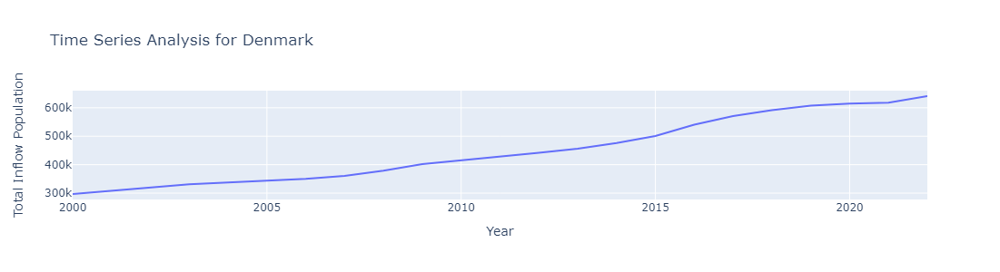

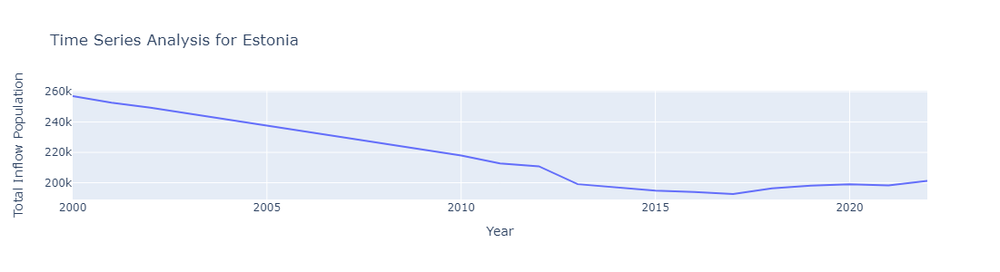

...

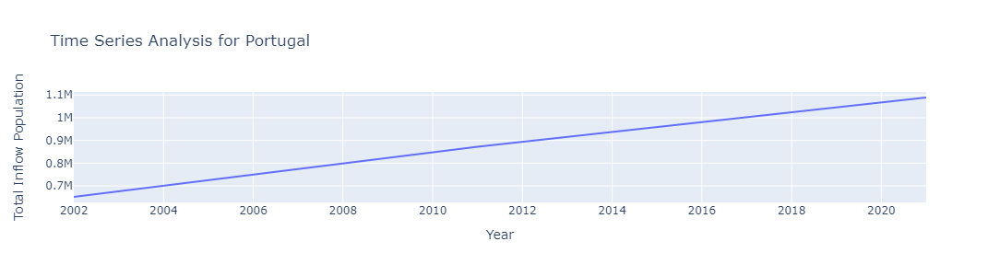

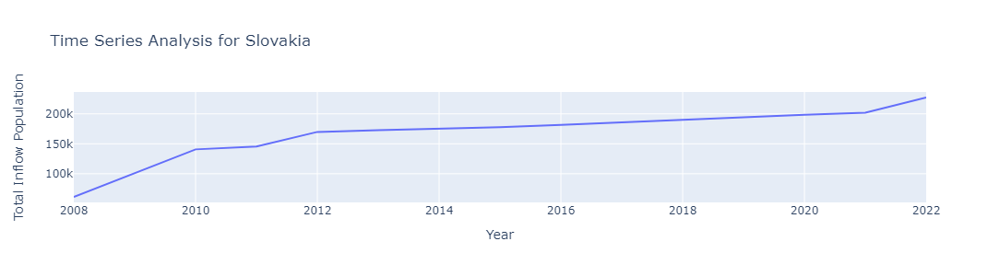

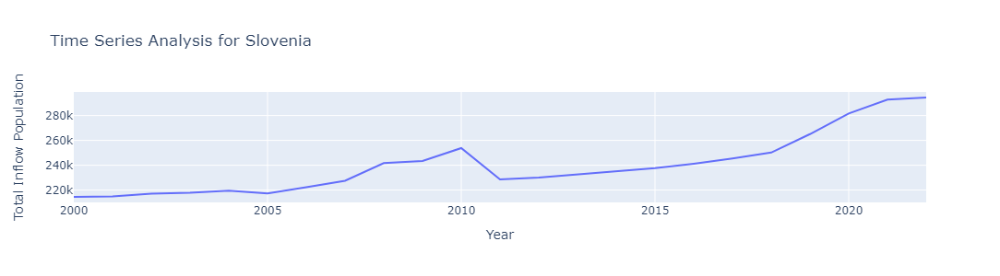

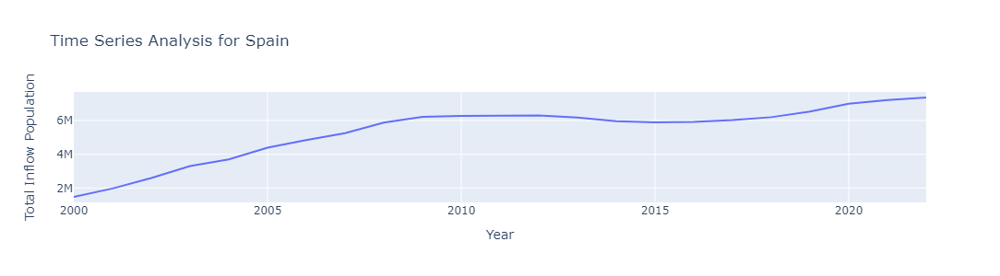

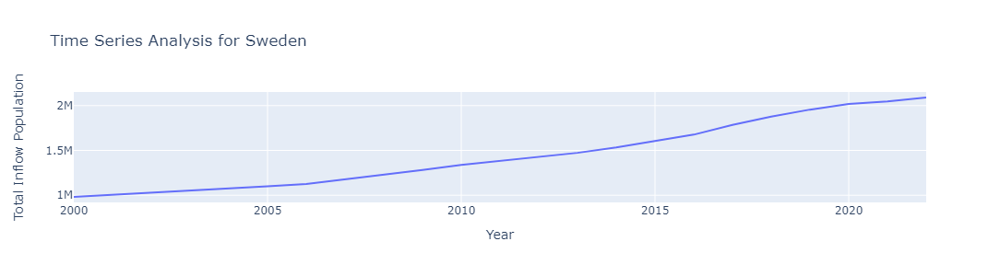

In [19]:
stock_population_foreign_born_df.apply(create_time_series_plot, axis=1);

#### Analysis of Population Spikes/Dips

#### Population Spikes Context

Based on the analysis of population inflow acrss 2000-2022, it was determined that the years with the highest population spike/dip are: 

----------------------------------------------------------
**2020** - The main factor affecting immigration into the European Union (EU) in 2020 was the global COVID-19 pandemic. With widespread travel restrictions and border closures aimed at curbing the virus, international migration slowed significantly. Many individuals postponed or canceled plans to move to EU countries for work, study, or family reasons due to health concerns and travel limitations. Economic uncertainties resulting from the pandemic, such as job losses, also contributed to the decline in immigration. Overall, the pandemic led to a notable reduction in immigrant inflow to the EU compared to previous years.

**2015** - The major event in 2015 that affected immigrant inflow across the European Union (EU) was the European migrant crisis. This crisis was characterized by a significant influx of refugees and migrants, primarily from war-torn countries in the Middle East and North Africa, seeking asylum and better living conditions in EU member states. The crisis led to heightened tensions, debates over immigration policies, and the implementation of various measures by EU countries to manage the influx of migrants.

**2021** - In 2021, one significant event that increased immigrant inflow across the European Union (EU) was the Taliban's takeover of Afghanistan. This led to a surge in Afghan refugees seeking asylum in EU member states, particularly those involved in military operations in Afghanistan. The humanitarian crisis sparked by the Taliban's resurgence prompted discussions among EU countries regarding refugee resettlement and asylum policies, resulting in an increase in immigrant arrivals to the EU.

**2009** - In 2009, a major event that decreased immigrant inflow across the European Union (EU) was the global financial crisis. The economic downturn resulted in decreased job opportunities and heightened unemployment rates in many EU countries, leading to a decline in labor migration. Additionally, stricter immigration policies were implemented by some EU member states in response to the economic crisis, making it more challenging for immigrants to enter and find work in the EU.

### Part 3: Spatial Analysis of Immigration Across EU

The function defined below generates a heatmap centered around Europe. It uses geo spacial data from external libraries and our datasets to draw a heatmap showing which countries have the highest concentration of migrant population. 

In [20]:
# Load Geo spacial data from external library
world_geojson = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world_geojson.to_file("data/world.geojson", driver='GeoJSON')


def generate_foreign_population_heat_map(data, field_name='Population'):
    # Defining coordinates for map center
    europe_center = [54.5260, 15.2551]

    # Initialize heat map
    europe_map = folium.Map(location=europe_center, zoom_start=4)

    # Create a Folium map with geo spacial data and loaded dataset
    folium.Choropleth(
        geo_data='data/world.geojson',
        data=data,
        # Using average values across all years (2000-2022)
        columns=[data.index, 'Average'],
        key_on='feature.properties.name',
        fill_color='viridis',
        fill_opacity=0.7,
        line_opacity=0.2,
        legend_name=field_name,

    ).add_to(europe_map)
    display(europe_map)

### Inflow Population

In [21]:
generate_foreign_population_heat_map(foreign_population_inflow_df, 'Inflow Population')


### Outflow Population

In [22]:
generate_foreign_population_heat_map(foreign_population_outflow_df, 'Outflow Population')

### Foreign Stock Population

In [23]:
generate_foreign_population_heat_map(stock_population_foreign_df, 'Foreign Stock Population')

### Foreign Born Stock Population

In [24]:
generate_foreign_population_heat_map(stock_population_foreign_born_df, 'Foreign Born Stock Population')

### Part 4: Forecasting of Future Population

Several forecasting methods were tried including ARIMA, RandomForestRegressor, VAR, and Linear Regression. However, due to limited amount of data, it was determined that a simple linear regression would be the best option. More advanced forecasting have been proven to be ineffective when predicting values for more than 1 year as there are little variation of the values across the subsequent years. 

#### Forecasting with Linear Regression

#### Defining Forecast Years

In [25]:
num_of_prediction_years = 5
last_year = 2022
forecast_years = [year for year in range(last_year+1, last_year + 1 + num_of_prediction_years)]

#### Define Forecasting Function

In [26]:
def forecast_population_growth(data, forecast_years):

    #Clean and reshape data for fitting
    cleaned_series = data[:-2].dropna()
    X = np.array(cleaned_series.index).reshape(-1, 1)
    y = np.array(cleaned_series.values).reshape(-1, 1)

    #Create linear regression model and fit data
    model = LinearRegression()
    model.fit(X, y)

    #Use model to predict data for forecast years
    forecast_data = model.predict(np.array(forecast_years).reshape(-1,1)).flatten()
    return pd.Series(forecast_data.astype(int), index = forecast_years)

### Inflow Population Forecast

In [27]:
forecast_foreign_population_inflow = foreign_population_inflow_df.swifter.apply(forecast_population_growth, args = ([forecast_years]), axis = 1)
forecast_foreign_population_inflow.head(5)

Pandas Apply:   0%|          | 0/20 [00:00<?, ?it/s]

,2023,2024,2025,2026,2027
Country,,,,,
Austria,162669,166485,170302,174119,177935
Belgium,136092,139004,141917,144830,147743
Czechia,52991,53584,54176,54769,55361
Denmark,54936,56497,58057,59618,61179
Estonia,12030,12732,13434,14136,14838


### Outflow Population Forecast

In [28]:
forecast_foreign_population_outflow = foreign_population_outflow_df.swifter.apply(forecast_population_growth, args = ([forecast_years]), axis = 1)
forecast_foreign_population_outflow.head(5)

Pandas Apply:   0%|          | 0/20 [00:00<?, ?it/s]

,2023,2024,2025,2026,2027
Country,,,,,
Austria,97825,100201,102577,104953,107329
Belgium,66479,67922,69365,70808,72251
Czechia,15588,15380,15173,14965,14758
Denmark,46860,48423,49986,51549,53112
Estonia,5719,6063,6407,6751,7095


### Foreign Stock Population Forecast

In [29]:
forecast_stock_population_foreign = stock_population_foreign_df.swifter.apply(forecast_population_growth, args = ([forecast_years]), axis = 1)
forecast_stock_population_foreign.head(5)

Pandas Apply:   0%|          | 0/20 [00:00<?, ?it/s]

,2023,2024,2025,2026,2027
Country,,,,,
Austria,1542183,1584809,1627434,1670060,1712686
Belgium,1548447,1582751,1617055,1651359,1685663
Czechia,645168,665081,684993,704905,724817
Denmark,558871,574270,589668,605067,620465
Estonia,189149,185182,181215,177249,173282


### Foreign-born Stock Population Forecast

In [30]:
forecast_stock_population_foreign_born_df = stock_population_foreign_born_df.swifter.apply(forecast_population_growth, args = ([forecast_years]), axis = 1)
forecast_stock_population_foreign_born_df.head(5)

Pandas Apply:   0%|          | 0/20 [00:00<?, ?it/s]

,2023,2024,2025,2026,2027
Country,,,,,
Austria,1858734,1899837,1940940,1982043,2023146
Belgium,2194841,2246595,2298349,2350103,2401857
Czechia,489486,490972,492459,493946,495433
Denmark,648460,665057,681655,698252,714850
Estonia,181966,179047,176128,173209,170290


#### Visualizing Forecast
Defining function to create a time-series graph for the forecasts.

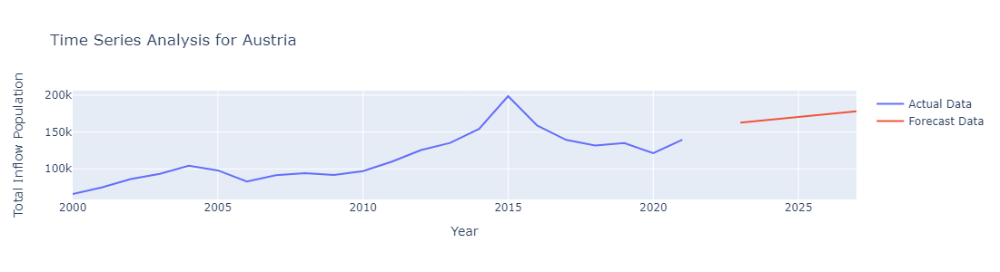

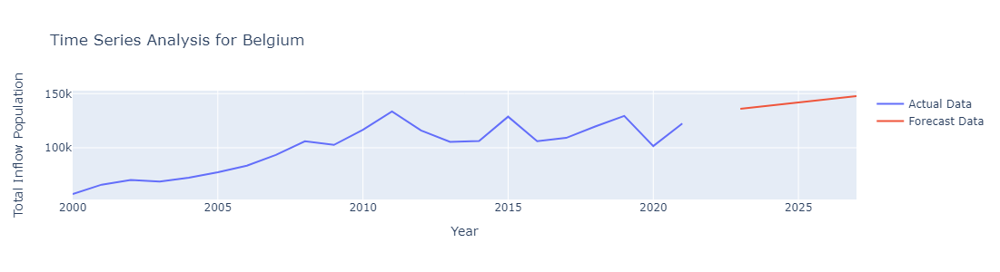

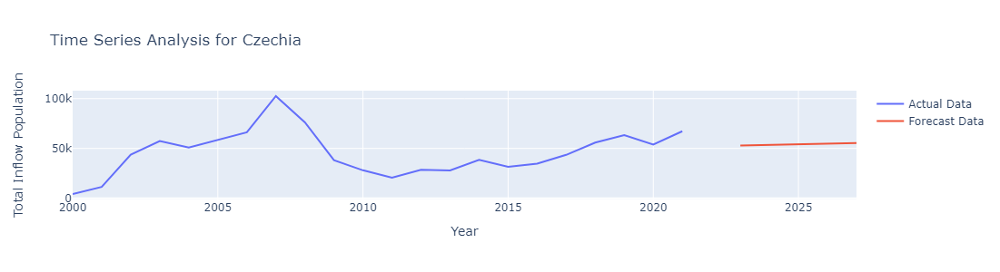

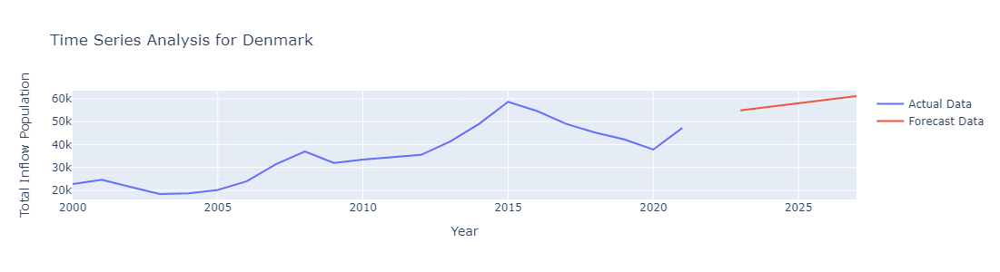

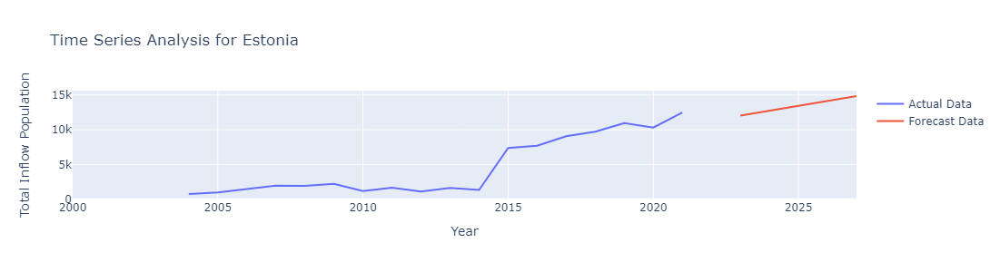

...

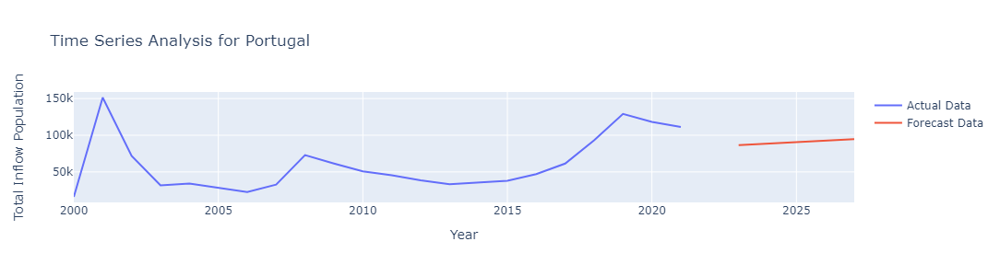

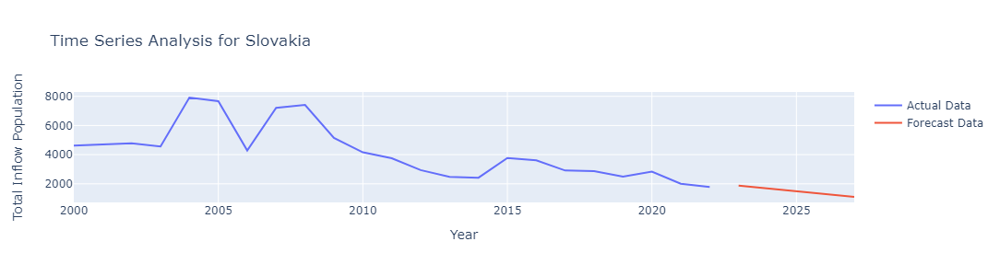

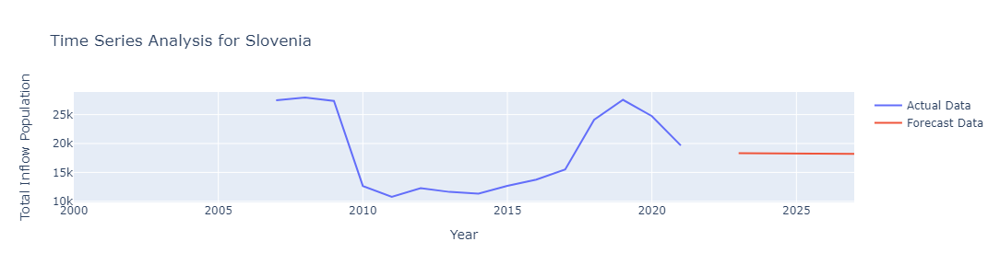

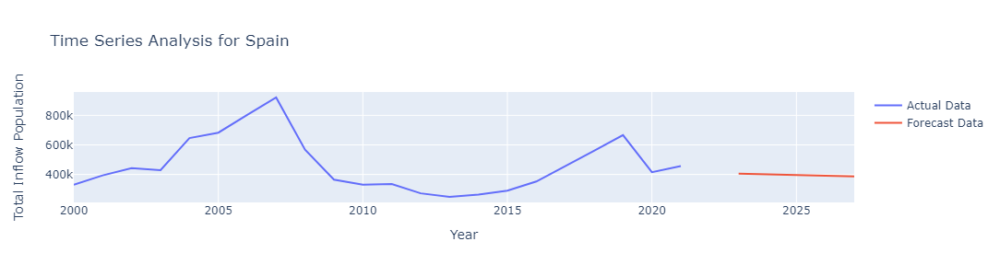

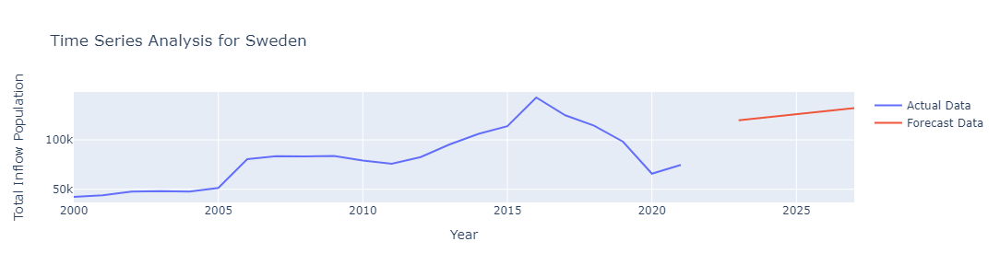

In [36]:
def create_forecast_graph(actual_data, forecast_data):
    #Create a time-series plot from actual data
    actual_data_plot = go.Scatter(
        x =actual_data.index[:-2],
        y =actual_data.values[:-2],
        mode='lines',
        name='Actual Data'
    )

    #Get the forecast data for specified country
    country_forecast_data = forecast_data.loc[actual_data.name]

    #Create a time-series plot for forecast data
    forecast_data_plot = go.Scatter(
        x =country_forecast_data.index,
        y =country_forecast_data.values,
        mode='lines',
        name='Forecast Data'
    )
    #Adds necessary labels to plot
    layout = go.Layout(
        title=f'Time Series Analysis for {actual_data.name}',  
        xaxis=dict(title='Year'), 
        yaxis=dict(title='Total Inflow Population'),  
        height = 300,
    )
    fig = go.Figure(data=[actual_data_plot, forecast_data_plot], layout=layout)
    fig.show()



#### Visualization of Forecast for Inflow Population

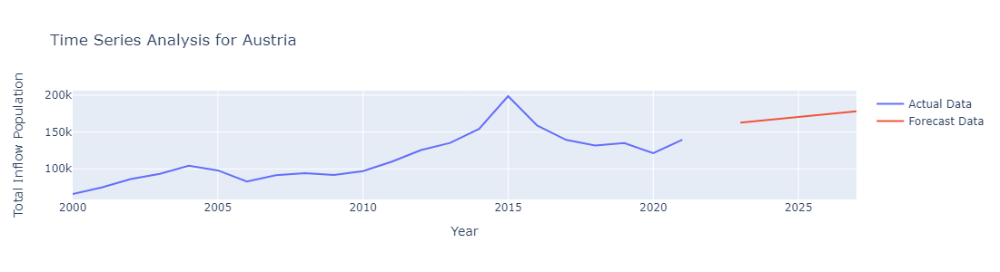

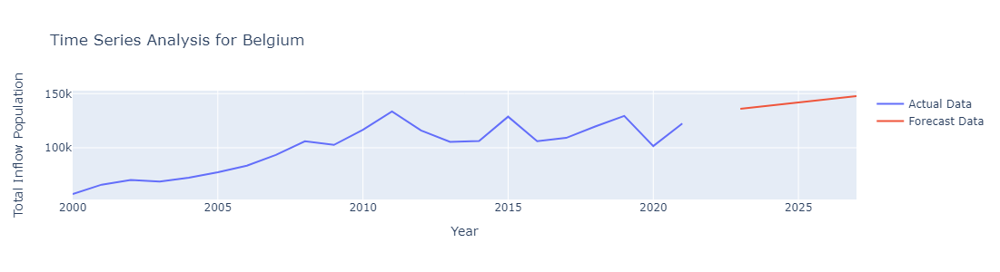

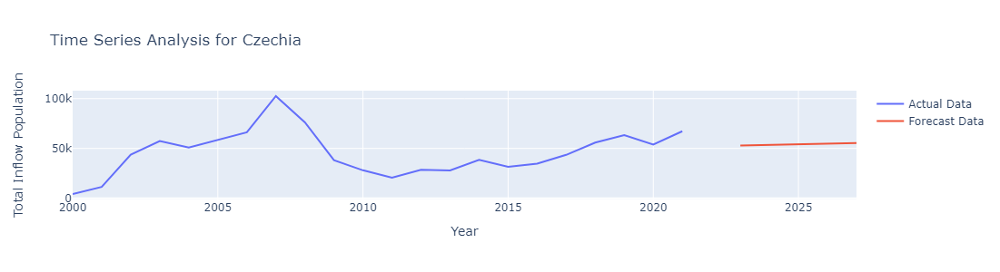

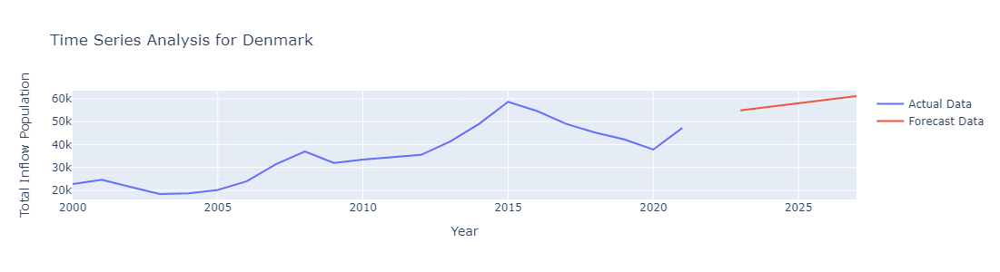

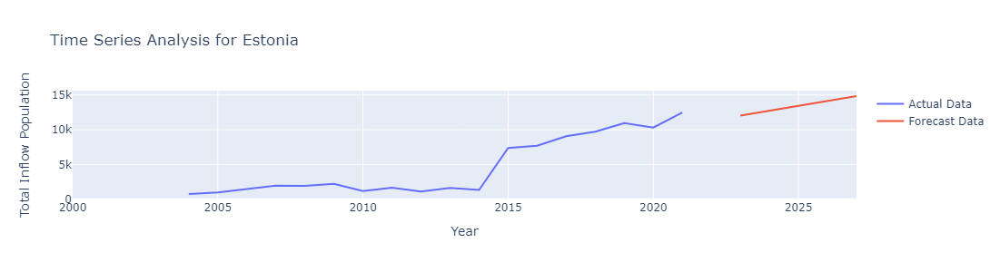

...

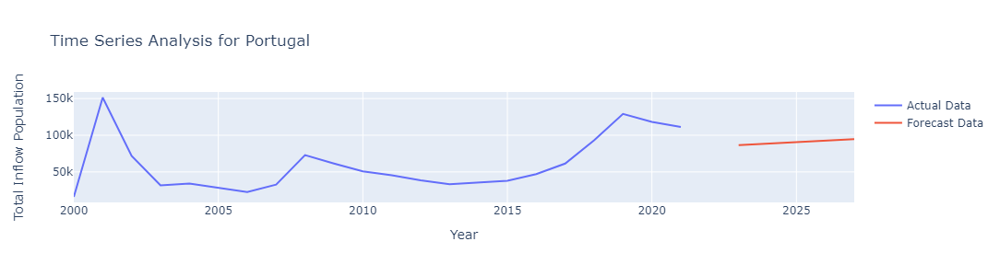

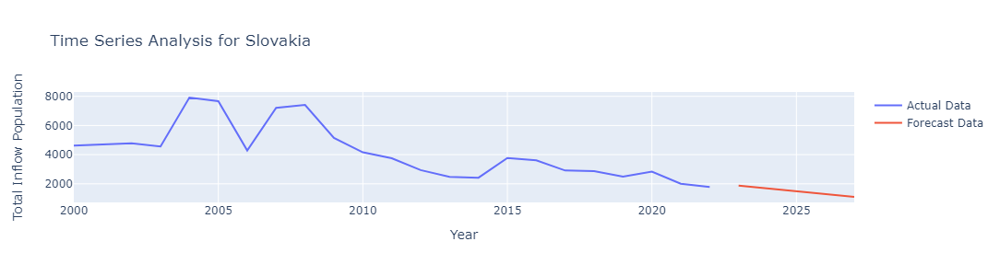

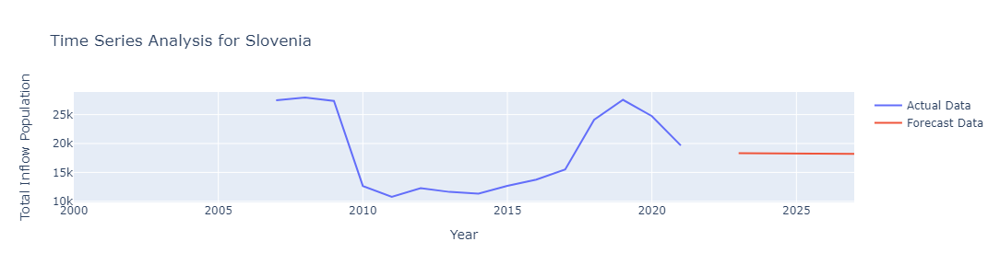

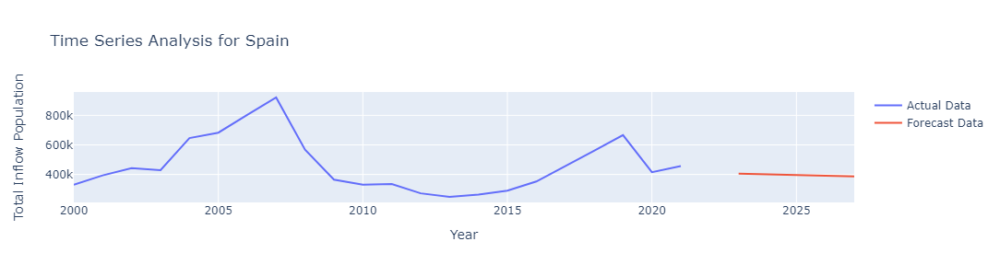

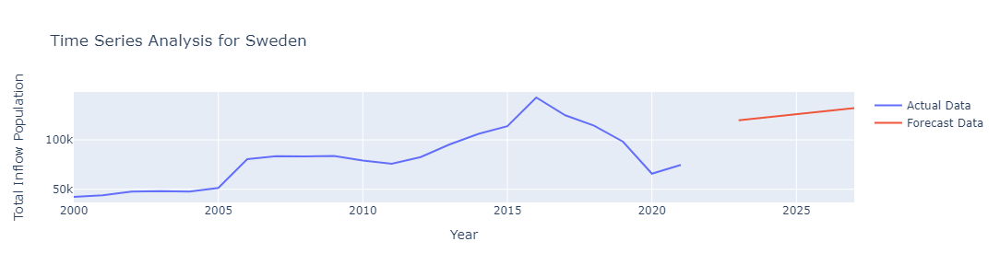

In [37]:
foreign_population_inflow_df.apply(create_forecast_graph, args = [forecast_foreign_population_inflow], axis = 1);

#### Visualization of Forecast for Outflow Population

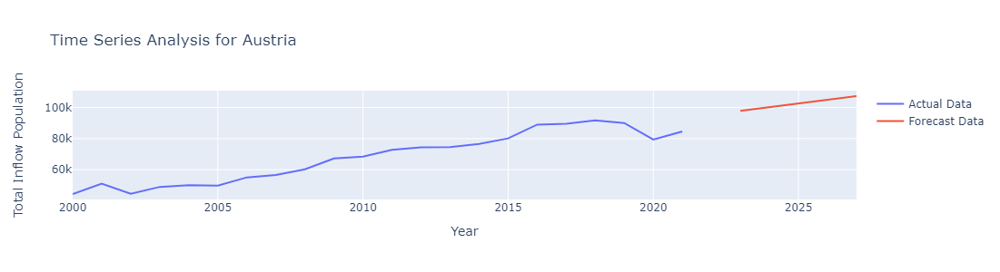

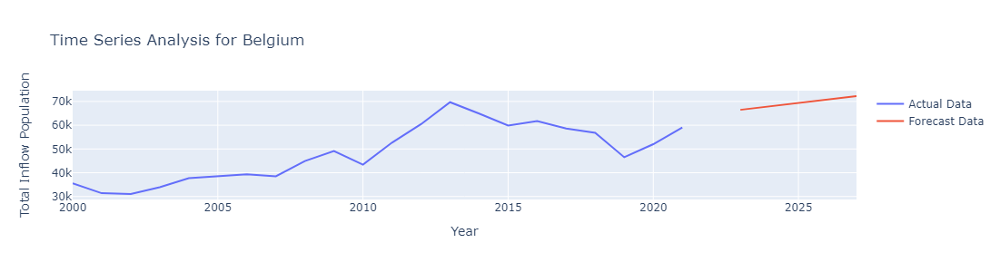

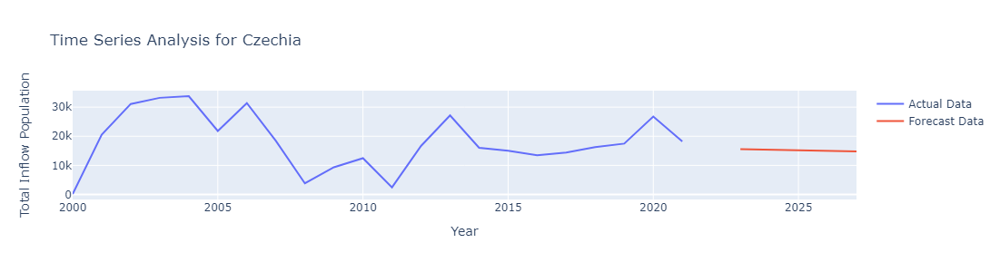

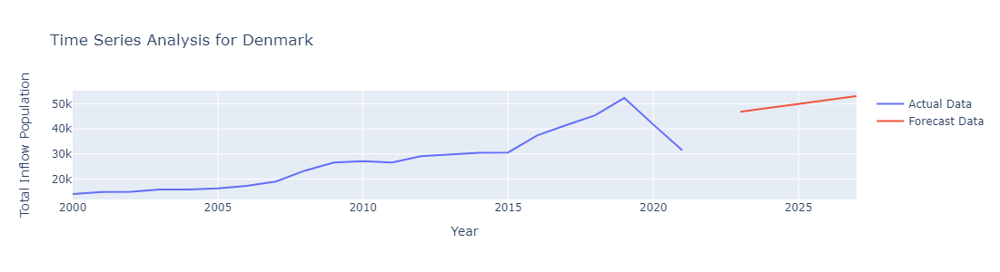

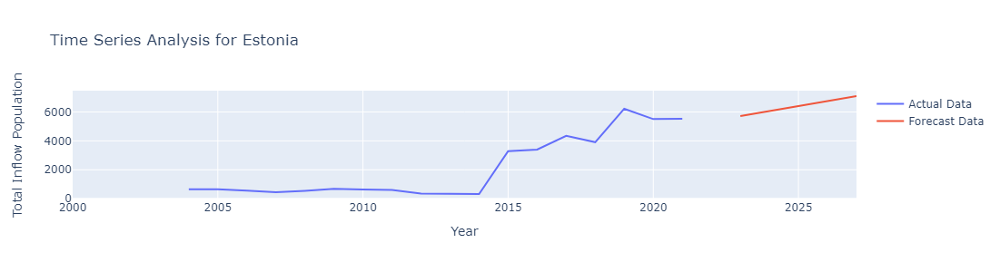

...

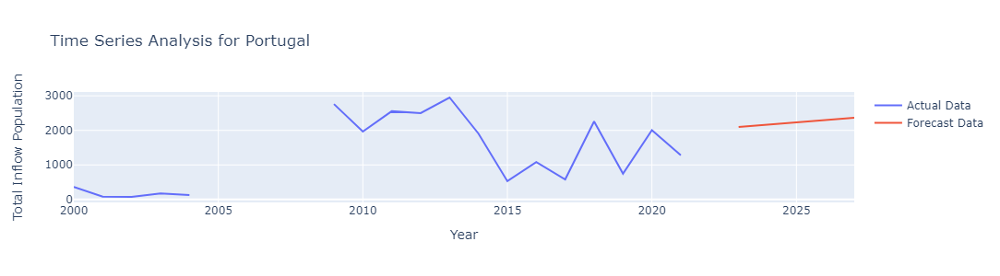

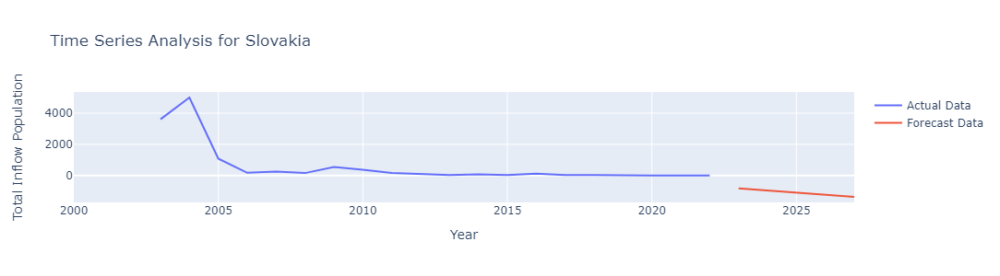

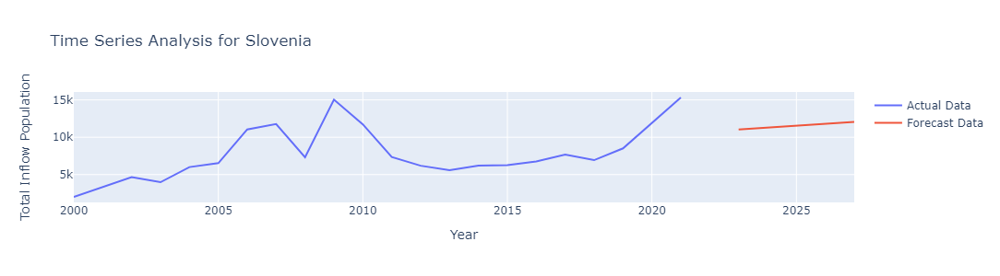

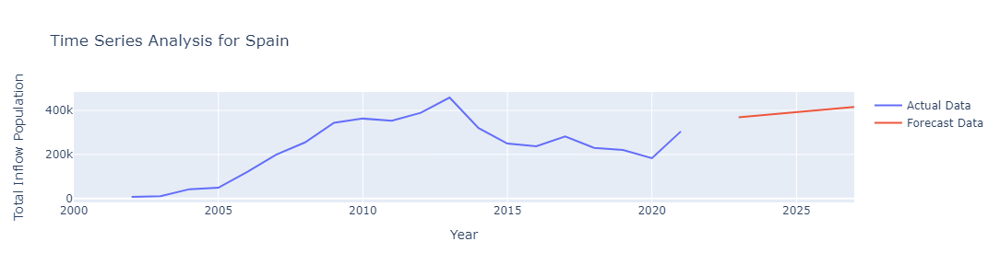

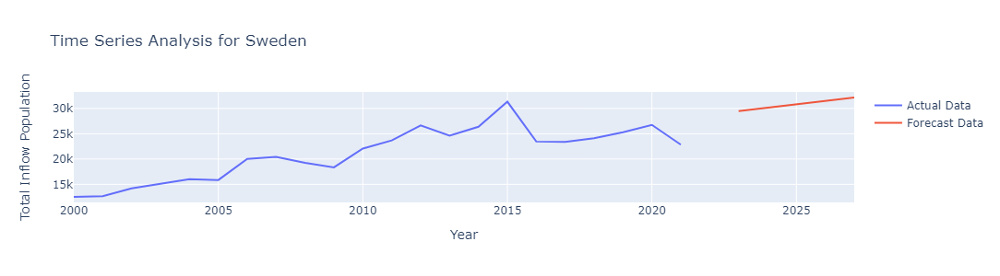

In [38]:
foreign_population_outflow_df.apply(create_forecast_graph, args = [forecast_foreign_population_outflow], axis = 1);

#### Visualization of Forecast for Foreign Stock Population

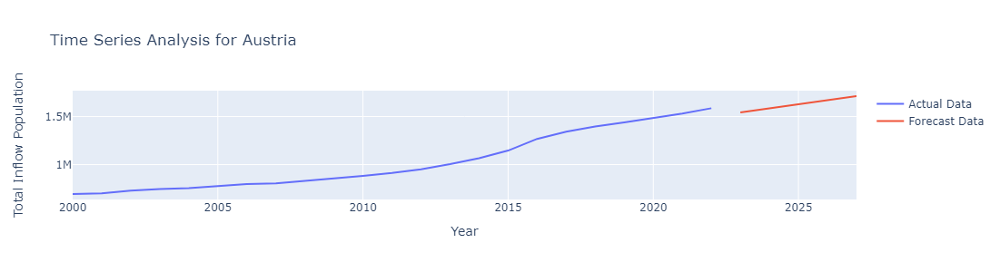

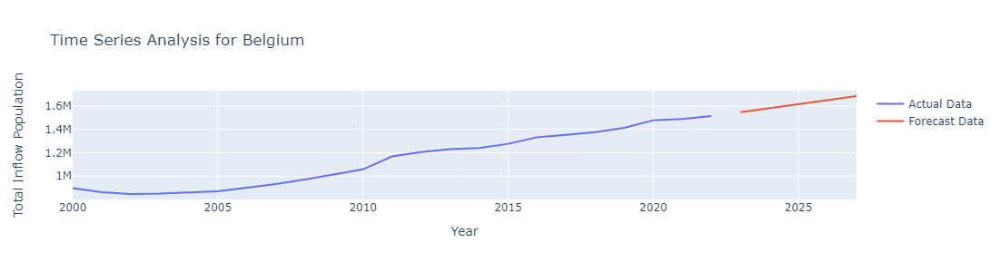

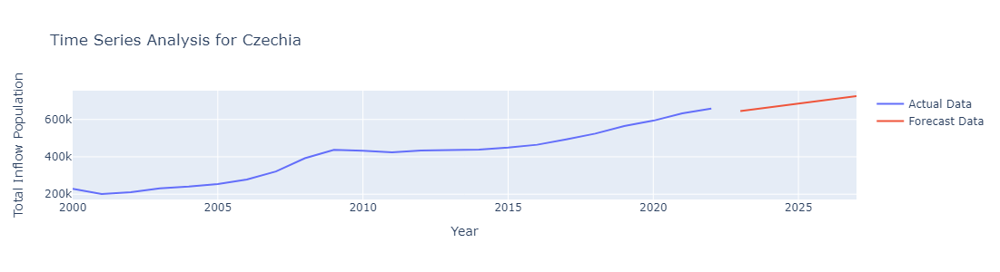

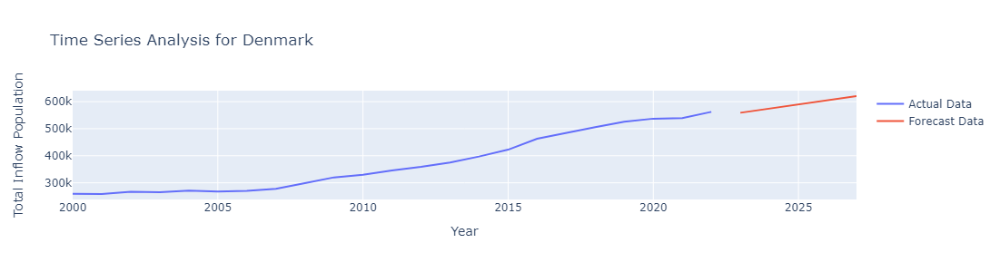

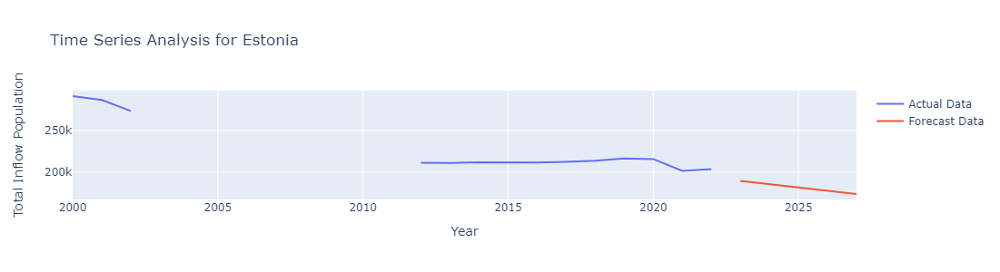

...

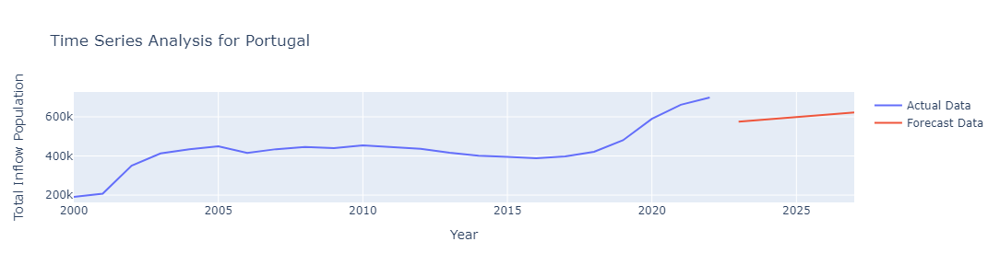

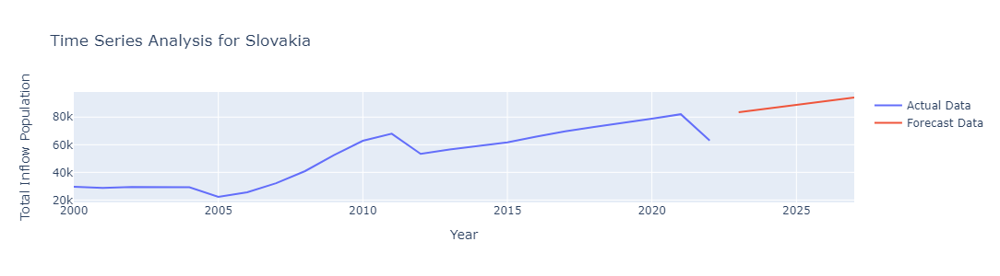

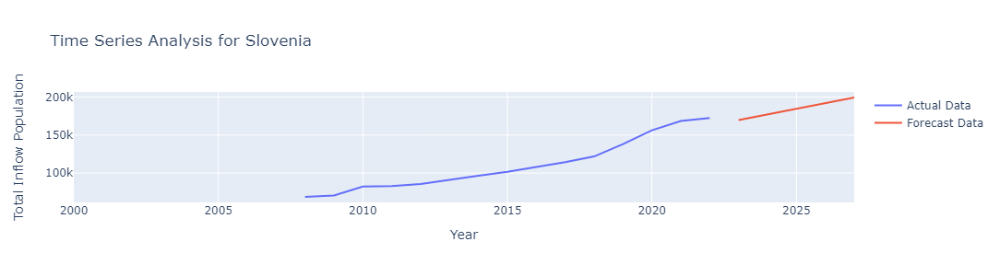

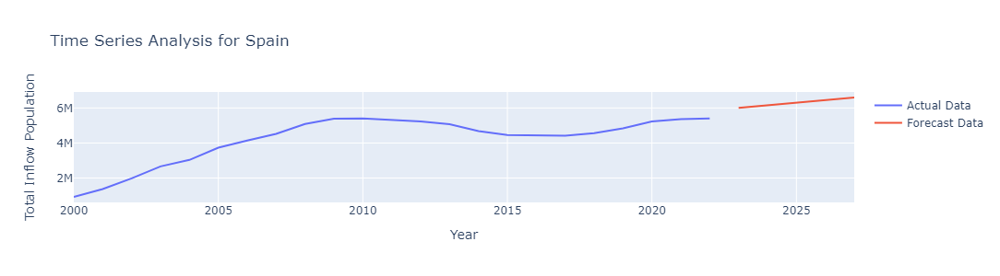

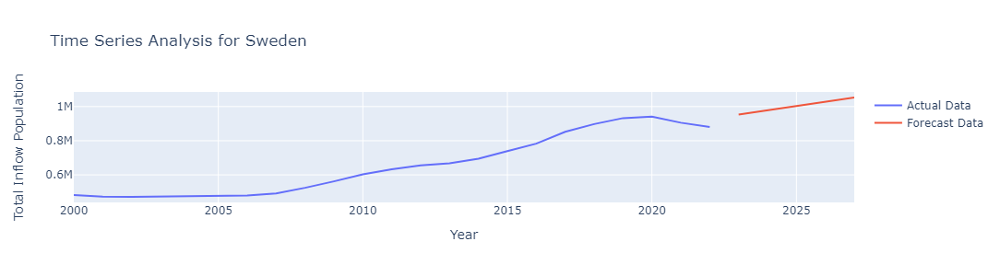

In [39]:
stock_population_foreign_df.apply(create_forecast_graph, args = [forecast_stock_population_foreign], axis = 1);

#### Visualization of Forecast for Foreign-born Stock Population

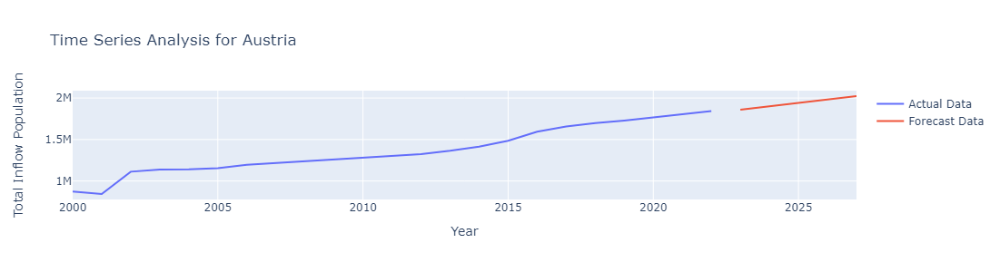

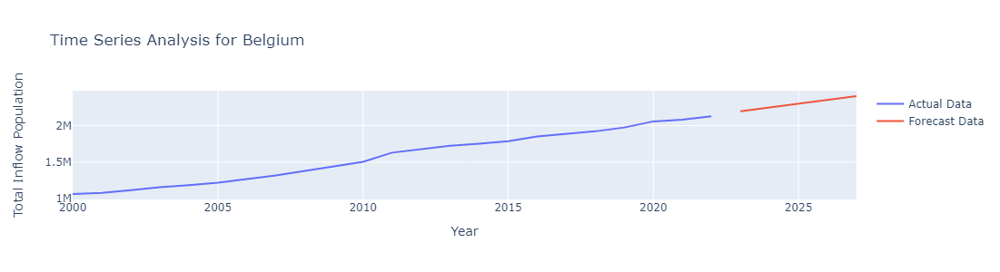

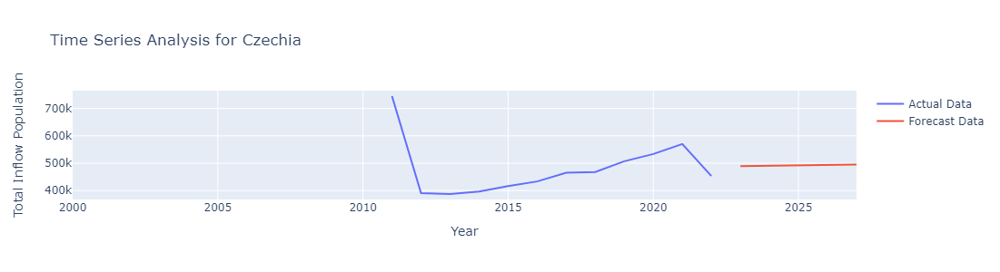

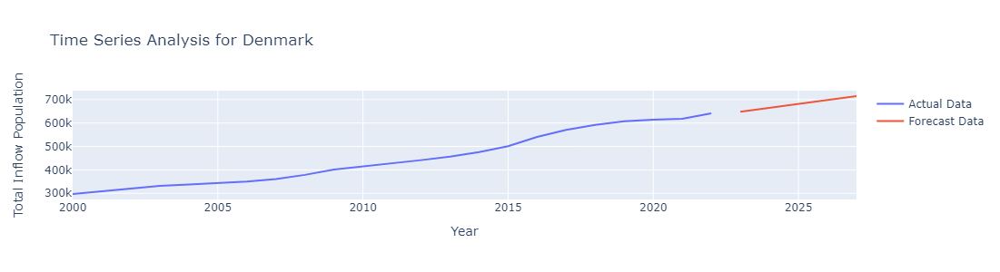

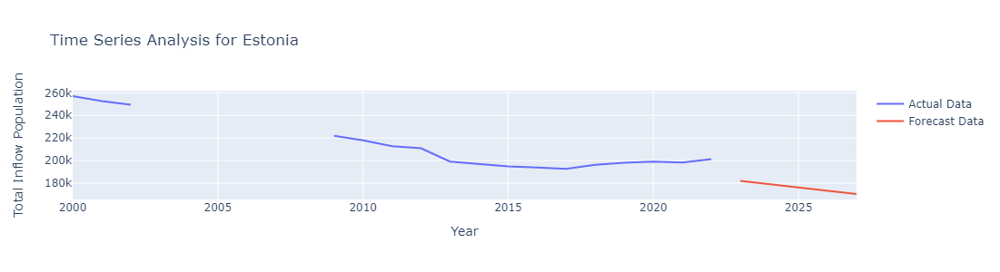

...

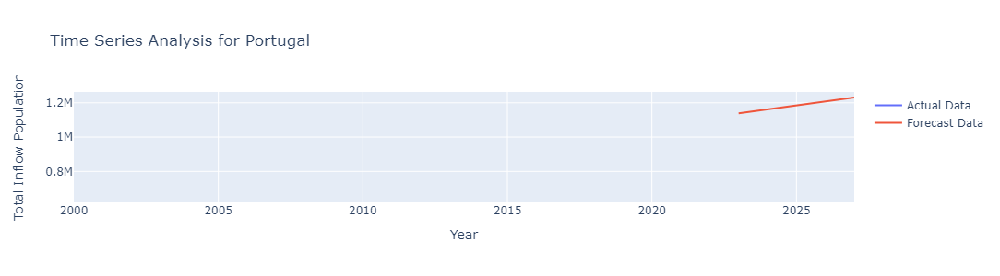

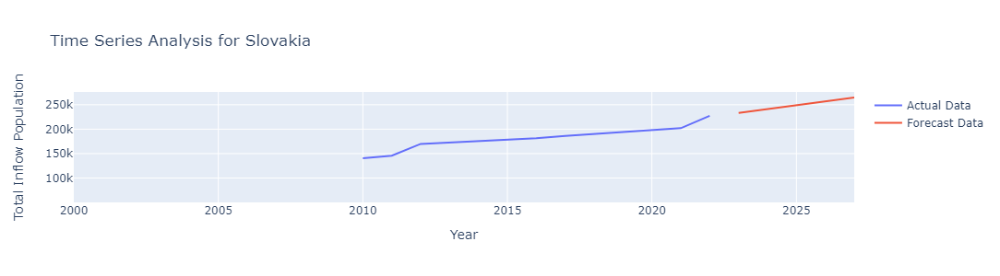

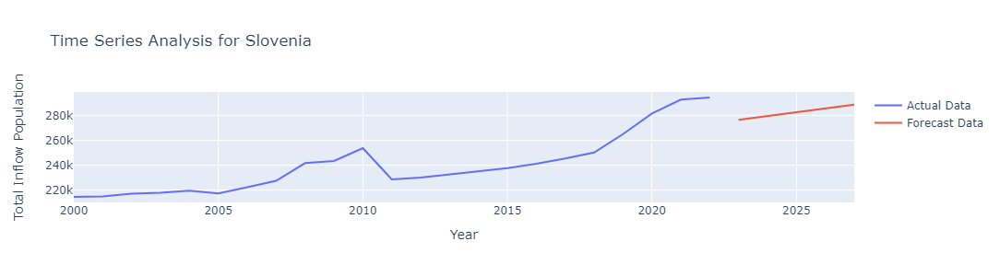

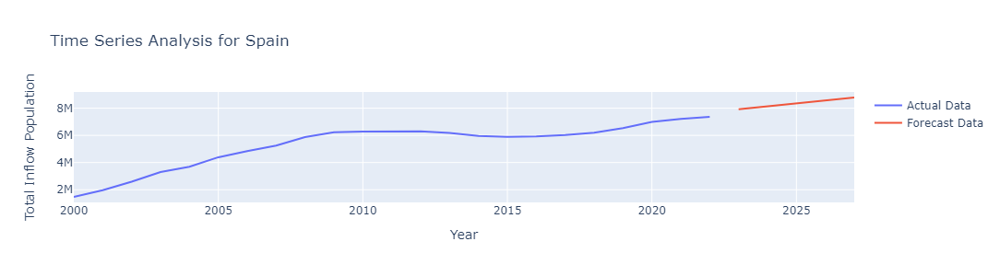

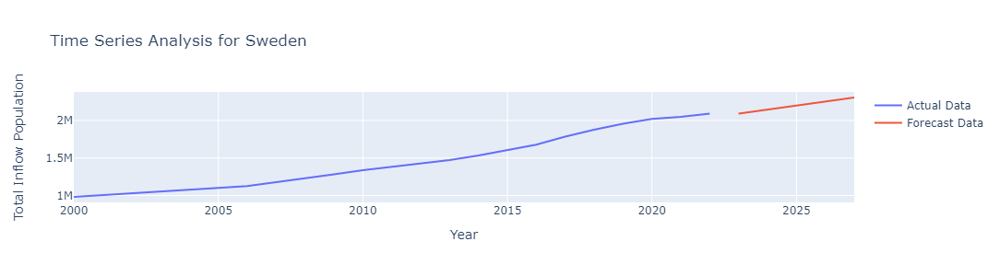

In [40]:
stock_population_foreign_born_df.apply(create_forecast_graph, args = [forecast_stock_population_foreign_born_df], axis = 1);